In [51]:
import tensorflow as tf
#import tensorflow_probability as tfp
import datetime, os
#hide tf logs 
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '1'  # or any {'0', '1', '2'} 
#0 (default) shows all, 1 to filter out INFO logs, 2 to additionally filter out WARNING logs, and 3 to additionally filter out ERROR logs
import scipy.optimize
import scipy.io
import numpy
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.mplot3d import Axes3D
import time
from pyDOE import lhs         #Latin Hypercube Sampling
import seaborn as sns 
import codecs, json
import pandas as pd

# generates same random numbers each time
np.random.seed(1234)
tf.random.set_seed(1234)

print("TensorFlow version: {}".format(tf.__version__))

TensorFlow version: 2.8.0


$\frac{\partial p(x,t)}{\partial t} = \frac{\partial}{\partial x}\left[\frac{m\omega^2}{\gamma} x \,p(x,t) + D \frac{\partial p(x,t)}{\partial x}\right] \qquad A= \frac{m\omega^2}{\gamma}= \frac{k}{\gamma}$ 

In [52]:
import pickle
real = pickle.load(open('./simulations/numerical_solution.sav', 'rb'))

# *Data Prep*

Training and Testing data is prepared from the solution file

In [53]:
from scipy import constants

Temperature = 300  # K
viscosity = 1e-3  # Kg / (m * s)
radius = 20e-10  # m
gamma = 6 * np.pi * viscosity * radius  # Kg / s
k = 3e-7  # Kg / s^2; 10GHz for frequency and 3e-26 Kg for mass
A = k / gamma  # s^-1
D = Temperature * constants.k / gamma  # m^2 / s
print(f"{gamma = } [Kg/s]")
print(f"{k = } [Kg/s^2]")
print(f"kB = {constants.k} [J/K]")
print(f"{A = :5.4e} [s^-1],\t{D = :4.4e} [m^2/s]")
# Change of units m -> µm
#                 s -> ms
# such that A ~ O(1), D ~ O(0.1)
A = A * 1e-3  # s^-1 -> ms^-1
D = D * 1e-3 * 1e+12  # m^2/s -> µm^2/ms
print(f"{A = :4.4e} [ms^-1],\t{D = :4.4e} [µm^2/ms]")
# Collocation points for every position and every time
x_lower = -0.1
x_upper = 0.25
N_x = 350
dx = (x_upper - x_lower) / N_x
x = np.linspace(x_lower, x_upper, N_x)  # µm line length
t_lower = 0
t_upper = 0.69 / A  # Typical Ornstein-Uhlenbeck time is ln(2) / A
N_steps = 200
t = np.linspace(t_lower, t_upper, N_steps)  # ms time interval
X, T = np.meshgrid(x, t)
# Initial Condition
psol=np.zeros((len(x),len(t)))
psol[:,0]=real[0]
#print(f"{A = } [ms^-1], {D = } [µm^2/ms]")

maxiter = 25000

gamma = 3.769911184307752e-11 [Kg/s]
k = 3e-07 [Kg/s^2]
kB = 1.380649e-23 [J/K]
A = 7.9577e+03 [s^-1],	D = 1.0987e-10 [m^2/s]
A = 7.9577e+00 [ms^-1],	D = 1.0987e-01 [µm^2/ms]


# *Test Data*

We prepare the test data to compare against the solution produced by the PINN.

In [54]:
''' X_u_test = [X[i],T[i]] [25600,2] for interpolation'''
X_p_test = np.hstack((X.flatten()[:, None], T.flatten()[:, None]))

# Domain bounds
low_bound = np.array([x_lower, t_lower]) 
up_bound = np.array([x_upper, t_upper])

'''
stacked column wise!
   u = [c1 
        c2
        .
        .
        cn]

   u =  [25600x1] 
'''
p = psol.flatten('F')

In [55]:
def trainingdata(N_bc, N_ic, N_f):
    """ Initial Condition"""

    #Initial Condition -1 =< x =<1 and t = 0  
    all_ic_x = np.vstack((X[0,:], T[0,:])).T
    all_ic_p = psol[:,0].reshape(len(psol[:,0]),1)
     
    '''Boundary Conditions'''

    #Boundary Condition x = -1 and 0 =< t =<1
    bottomedge_x = np.vstack((X[:,0], T[:,0])).T
    bottomedge_p = psol[-1,:].reshape(len(psol[-1,:]),1)

    #Boundary Condition x = 1 and 0 =< t =<1
    topedge_x = np.vstack((X[:,-1], T[:,0])).T
    topedge_p = psol[0,:].reshape(len(psol[0,:]),1)


    all_bc_x=np.vstack([bottomedge_x, topedge_x])
    # Reflecting conditions do not use the value of p
    #all_bc_p_train = np.vstack([ bottomedge_p, topedge_p])  

    #choose random N_bc and N:ic points for training
    index_bc = np.random.choice(all_bc_x.shape[0], N_bc, replace=False) 
    index_ic = np.random.choice(all_ic_x.shape[0], N_ic, replace=False)

    x_bc_train = all_bc_x[index_bc, :] 
    x_ic_train = all_ic_x[index_ic, :] 
    p_ic_train = all_ic_p[index_ic,:]    

    '''Collocation Points'''

    # Latin Hypercube sampling for collocation points 
    # N_f sets of tuples(x,t)
    x_f_train = low_bound + (up_bound-low_bound)*lhs(2,N_f)
 
    #x_f_train = np.vstack((x_f_train, x_bc_train, x_ic_train))

    '''Normalization Instants'''
    x_norm_instant = np.vstack((X[100,:],
                                T[100,:])).T
    
    return x_f_train, x_bc_train, x_ic_train, p_ic_train, x_norm_instant


# *Training Data*

The boundary conditions serve as the test data for the PINN and the collocation points are generated using **Latin Hypercube Sampling**

# **PINN**

Generate a **PINN** of L hidden layers, each with n neurons. 

Initialization: ***Xavier***

Activation: *tanh (x)*

In [6]:
extra_features = ["xLower-0.1","xUpper0.25","micrometers_miliseconds","k1e-7","r1e-20"]
print("Training with extra features:", extra_features)
additional_constraints = []
print("Training with extra constraints:", additional_constraints)


def save_train_history(NN):
    TRAIN_HISTORY = NN.get_training_history()
    data_filename = "./data/TRAIN_HISTORY_"
    if len(additional_constraints) != 0:
        for constrain in additional_constraints:
            data_filename = data_filename + constrain + "_"
    data_filename = data_filename + f"IC{N_ic}_BC{N_bc}_f{N_f}_t{t_upper}_iter{maxiter}"
    if len(extra_features) != 0:
        for feat in extra_features:
            data_filename = data_filename + "_" + feat
    print("Saving", data_filename, "...")
    pd.DataFrame(TRAIN_HISTORY).to_csv(data_filename + ".csv")

def save_model_weights(NN):
    model_filename = "./models/MODEL_WEIGHTS_"
    if len(additional_constraints) != 0:
        for constrain in additional_constraints:
            model_filename = model_filename + constrain + "_"
    model_filename = model_filename + f"IC{N_ic}_BC{N_bc}_f{N_f}_t{t_upper}_iter{maxiter}"
    if len(extra_features) != 0:
        for feat in extra_features:
            model_filename = model_filename + "_" + feat
    print("Saving", model_filename, "...")
    np.savetxt(model_filename + ".txt", NN.get_weights().numpy())

Training with extra features: ['xLower-0.1', 'xUpper0.25', 'micrometers_miliseconds', 'k1e-7', 'r1e-20']
Training with extra constraints: []


In [56]:
class PINN(tf.Module):
    def __init__(self,
                 layers,
                 do_print=True,
                 _additional_constraints=(),
                 a=10,
                 d=0.1,
                 f_regularization=1.0,
                 activation_function='tanh'):
        # The IC, BC, collocation points as well as p(IC points) and the domain upper/lower bounds are global variables,
        #     because they define the domain of the learning problem for our model,
        #     therefore they are required for our PINN class to be instantiated.
        for _global_variable in ['x_f_train', 'x_bc_train', 'x_ic_train', 'p_ic_train', 'x_norm_instants', 'low_bound',
                                'up_bound']:
            if _global_variable not in globals():
                raise ValueError("MissingGlobalVariable: " + _global_variable)
        super(PINN, self).__init__(name="PINN")
        self.layers = layers
        self.additional_constraints = _additional_constraints
        if activation_function == 'tanh':
            self.activation_function = tf.nn.tanh
        elif activation_function == 'swish':
            self.activation_function = tf.nn.swish
        else:
            raise ValueError("ActivationFunction:" + activation_function)
        self.a = a
        self.d = d
        self.f_regularization = f_regularization
        self.epoch = 0
        self.do_print = do_print
        self.save_training_after_n = 1000
        self.history = {"path": "",
                        "epoch": [],
                        "Total loss": [],
                        "IC loss": [],
                        "BC loss": [],
                        "f loss": [],
                        "Pr loss": [],
                        "Norm loss": [],
                        "Equi loss": []}
        self.W = []  #Weights and biases
        self.parameters = 0  #total number of parameters
        for i in range(len(layers) - 1):
            input_dim = layers[i]
            output_dim = layers[i + 1]
            #Xavier standard deviation
            std_dv = np.sqrt((2.0 / (input_dim + output_dim)))
            #weights = normal distribution * Xavier standard deviation + 0
            w = tf.random.normal([input_dim, output_dim], dtype='float64') * std_dv
            w = tf.Variable(w, trainable=True, name='w' + str(i + 1))
            b = tf.Variable(tf.cast(tf.zeros([output_dim]), dtype='float64'), trainable=True, name='b' + str(i + 1))
            self.W.append(w)
            self.W.append(b)
            self.parameters += input_dim * output_dim + output_dim

    def evaluate(self, subset):
        layer_input = (subset - low_bound) / (up_bound - low_bound)  # Normalization
        for i in range(len(self.layers) - 2):
            layer_output = tf.add(tf.matmul(layer_input, self.W[2 * i]), self.W[2 * i + 1])
            layer_input = self.activation_function(layer_output)
        layer_output = tf.add(tf.matmul(layer_input, self.W[-2]), self.W[-1])  # Regression: no activation to last layer
        return layer_output

    def get_weights(self):
        parameters_1d = []  # [.... W_i,b_i.....  ] 1d array
        for i in range(len(self.layers) - 1):
            w_1d = tf.reshape(self.W[2 * i], [-1])  #flatten weights
            b_1d = tf.reshape(self.W[2 * i + 1], [-1])  #flatten biases
            parameters_1d = tf.concat([parameters_1d, w_1d], 0)  #concat weights
            parameters_1d = tf.concat([parameters_1d, b_1d], 0)  #concat biases
        return parameters_1d

    def set_weights(self, parameters):

        for i in range(len(self.layers) - 1):
            shape_w = tf.shape(self.W[2 * i]).numpy()  # shape of the weight tensor
            size_w = tf.size(self.W[2 * i]).numpy()  #size of the weight tensor
            shape_b = tf.shape(self.W[2 * i + 1]).numpy()  # shape of the bias tensor
            size_b = tf.size(self.W[2 * i + 1]).numpy()  #size of the bias tensor
            pick_w = parameters[0:size_w]  #pick the weights
            self.W[2 * i].assign(tf.reshape(pick_w, shape_w))  # assign
            parameters = np.delete(parameters, np.arange(size_w), 0)  #delete
            pick_b = parameters[0:size_b]  #pick the biases
            self.W[2 * i + 1].assign(tf.reshape(pick_b, shape_b))  # assign
            parameters = np.delete(parameters, np.arange(size_b), 0)  #delete

    def set_training_history(self, path):
        history = pd.read_csv(path)
        self.history["epoch"] = list(history["epoch"])
        if self.history["epoch"] is not []:
            self.epoch = self.history["epoch"]
        self.history["Total loss"] = list(history["Total loss"])
        self.history["IC loss"] = list(history["IC loss"])
        self.history["BC loss"] = list(history["BC loss"])
        self.history["f loss"] = list(history["f loss"])
        self.history["Pr loss"] = list(history["Pr loss"])
        self.history["Norm loss"] = list(history["Norm loss"])
        self.history["Equi loss"] = list(history["Equi loss"])

    def get_training_history(self):
        return self.history

    def set_epoch(self, epoch):
        self.epoch = epoch

    def get_epoch(self):
        return self.epoch

    def set_pde_params(self, a, d):
        self.a = a
        self.d = d

    # Satisfy the IC
    def loss_ic(self, x_ic, p_ic):
        # Relative MSE
        return tf.reduce_mean(tf.square(p_ic - self.evaluate(x_ic))) / tf.reduce_sum(tf.square(p_ic))

    # Satisfy the reflecting boundary
    def loss_bc(self, boundary_points):
        variable_bc = tf.Variable(boundary_points, dtype='float64', trainable=False)
        x_bc = variable_bc[:, 0:1]
        t_bc = variable_bc[:, 1:2]
        with tf.GradientTape(persistent=True) as tape:
            tape.watch(x_bc)
            tape.watch(t_bc)
            tensor_bc = tf.stack([x_bc[:, 0], t_bc[:, 0]], axis=1)
            output_p_bc = self.evaluate(tensor_bc)
        p_x = tape.gradient(output_p_bc, x_bc)  #more efficient out of the context
        del tape
        flux = -1 * (self.a * x_bc * output_p_bc + self.d * p_x)
        return tf.reduce_mean(tf.square(flux))  # MSE_bc

    # Satisfy the PDE at the collocation points
    def loss_pde(self, collocation_points):
        variable_collocation = tf.Variable(collocation_points, dtype='float64', trainable=False)
        x_f = variable_collocation[:, 0:1]
        t_f = variable_collocation[:, 1:2]
        with tf.GradientTape(persistent=True) as tape:
            tape.watch(x_f)
            tape.watch(t_f)
            tensor_collocation = tf.stack([x_f[:, 0], t_f[:, 0]], axis=1)
            output_p_collocation = self.evaluate(tensor_collocation)
            p_x = tape.gradient(output_p_collocation, x_f)  #inside the context bc we need it for higher derivative
        p_t = tape.gradient(output_p_collocation, t_f)
        p_xx = tape.gradient(p_x, x_f)
        del tape
        f = p_t - self.a * output_p_collocation - self.a * x_f * p_x - self.d * p_xx
        return tf.reduce_mean(tf.square(f))  # MSE_f

    # Satisfy |probability| = 1 at some instants
    def loss_norm(self):
        o = self.evaluate(x_norm_instants)
        return tf.abs(tf.reduce_sum(o) * dx - 1.0)  # ME |norm - 1|

    # Must be Boltzmann distributed at t >> 1 with ß * m * w ^ 2 = A / D
    def loss_equi(self):
        # Typical time is ln(2) / A ≈ 0.69 / A
        t_large = 10 * (0.69 / self.a) * np.ones(256).reshape(256, 1)
        x_domain = np.linspace(low_bound[0], up_bound[0], 256).reshape(256, 1)
        x_at_large_t = tf.stack([x_domain[:, 0], t_large[:, 0]], axis=1)
        output = self.evaluate(x_at_large_t)
        boltzmann_dist = tf.exp(-1 * (self.a / (2 * self.d)) * x_domain ** 2)
        z = tf.reduce_sum(boltzmann_dist) * dx
        boltzmann_dist = boltzmann_dist / z
        # L2 norm (Boltzmann_dist - output)
        return tf.reduce_mean(tf.square(boltzmann_dist - output) * dx)

    # Satisfy p > 0 at IC and the collocation points
    def loss_prob(self, x_ic, x_f):
        o1 = self.evaluate(x_ic)
        o2 = self.evaluate(x_f)
        negatives = tf.where(tf.greater_equal(o1, 0.),
                             tf.zeros_like(o1),
                             o1)
        loss_pr = tf.abs(tf.reduce_mean(negatives))  # MSE (p < 0) at IC
        negatives = tf.where(tf.greater_equal(o2, 0.),
                             tf.zeros_like(o2),
                             o2)
        loss_pr = loss_pr + tf.abs(tf.reduce_mean(negatives))  # MSE (p < 0) at collocation
        return loss_pr

    def loss(self, x_ic, p_ic, x_bc, x_f):
        loss_ic = self.loss_ic(x_ic, p_ic)
        loss_bc = self.loss_bc(x_bc)
        loss_f = self.loss_pde(x_f)
        loss_prob = self.loss_prob(x_ic, x_f)
        loss_norm = self.loss_norm()
        loss_equi = self.loss_equi()
        loss = loss_ic + loss_bc + self.f_regularization * loss_f
        if "prob" in self.additional_constraints:
            loss = loss + loss_prob
        if "norm" in self.additional_constraints:
            loss = loss + loss_norm
        if "equi" in self.additional_constraints:
            loss = loss + loss_equi
        return loss, loss_ic, loss_bc, loss_f, loss_prob, loss_norm, loss_equi

    def optimizerfunc(self, parameters):
        self.set_weights(parameters)
        with tf.GradientTape() as tape:
            tape.watch(self.trainable_variables)
            total_loss, loss_ic, loss_bc, loss_f, loss_pr, loss_norm, loss_equi = self.loss(x_ic_train, p_ic_train,
                                                                                            x_bc_train, x_f_train)
            grads = tape.gradient(total_loss, self.trainable_variables)
        self.epoch += 1 # This has been an iteration of the training process.
        if self.do_print:
            tf.print(f"epoch: {self.epoch}", f"- Total: {total_loss:5.4e}", f"IC: {loss_ic:5.4e}",
                     f"BC: {loss_bc:5.4e}", f"f: {loss_f:5.4e}", f"Norm: {loss_norm:5.4e}", f"equi: {loss_equi:5.4e}")
        del tape
        grads_1d = []  #flatten grads
        for i in range(len(self.layers) - 1):
            grads_w_1d = tf.reshape(grads[2 * i], [-1])  #flatten weights
            grads_b_1d = tf.reshape(grads[2 * i + 1], [-1])  #flatten biases
            grads_1d = tf.concat([grads_1d, grads_w_1d], 0)  #concat grad_weights
            grads_1d = tf.concat([grads_1d, grads_b_1d], 0)  #concat grad_biases
        self.history["epoch"].append(self.epoch)
        self.history["Total loss"].append(float(total_loss))
        self.history["IC loss"].append(float(loss_ic))
        self.history["BC loss"].append(float(loss_bc))
        self.history["f loss"].append(float(loss_f))
        self.history["Pr loss"].append(float(loss_pr))
        self.history["Norm loss"].append(float(loss_norm))
        self.history["Equi loss"].append(float(loss_equi))
        if self.epoch % self.save_training_after_n == 0:
            save_train_history(self)
            save_model_weights(self)
        return total_loss.numpy(), grads_1d.numpy()


# *Solution Plot*

In [57]:
def differenceplot(u_pred, real):
    
    fig, ax = plt.subplots(dpi=250)
    ax.axis('off')

    gs0 = gridspec.GridSpec(2, 3)
    gs0.update(top=1, bottom=0, left=0.1, right=2, wspace=0.3, hspace =0.4)
    ax = plt.subplot(gs0[0, :])
    rel_err = np.absolute(u_pred-real)/np.max(real)
    rel_err[rel_err > 1] = 1
    h = ax.imshow(rel_err, interpolation='nearest', cmap='rainbow', 
                extent=[T.min(), T.max(), X.min(), X.max()], 
                origin='lower', aspect='auto')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    fig.colorbar(h, cax=cax)
 
    #ax.plot(X_u_train[:,1], X_u_train[:,0], 'kx', label = 'Data (%d points)' % (u_train.shape[0]), markersize = 4, clip_on = False)

    line = np.linspace(x.min(), x.max(), 2)[:,None]
    #ax.plot(t[25]*np.ones((2,1)), line, 'w-', linewidth = 1)
    #ax.plot(t[50]*np.ones((2,1)), line, 'w-', linewidth = 1)
    #ax.plot(t[75]*np.ones((2,1)), line, 'w-', linewidth = 1)    

    ax.set_xlabel('$t(ms)$')
    ax.set_ylabel('$x(\mu m)$')
    ax.legend(frameon=False, loc = 'best')
    ax.set_title('$p(x,t)$', fontsize = 10)
    
    ''' 
    Slices of the solution at points t = 0.25, t = 0.50 and t = 0.75
    '''
    
    ####### Row 1: u(t,x) slices ##################
    #gs1 = gridspec.GridSpec(1, 3)
    #gs1.update(top=0.3, bottom=-0.1, left=0.1, right=2, wspace=0.5)

    ax = plt.subplot(gs0[1, 0])
    #ax.plot(x,usol.T[0,:], 'b-', linewidth = 2, label = 'Exact')       
    ax.plot(x, u_pred.T[0,:], 'r', linewidth = 2, label = 'Prediction')
    ax.plot(x, real.T[0,:], 'b', linewidth = 2, label = 'Real')
    ax.set_xlabel('$x$')
    ax.set_ylabel('$p(x,t)$')    
    ax.set_title('$t = 0.s$', fontsize = 10)
    #ax.axis('square')
    ax.set_xlim([x_lower ,x_upper])
    ax.set_ylim([0.0, 0.015])

    ax = plt.subplot(gs0[1, 1])
    #ax.plot(x,usol.T[50,:], 'b-', linewidth = 2, label = 'Exact')       
    ax.plot(x,u_pred.T[int(0.15*len(t)),:], 'r', linewidth = 2, label = 'Prediction')
    ax.plot(x,real.T[int(0.15*len(t)),:], 'b', linewidth = 2, label = 'Real')
    ax.set_xlabel('$x$')
    ax.set_ylabel('$p(x,t)$')
    #ax.axis('square')
    ax.set_xlim([x_lower, x_upper])
    ax.set_ylim([0.0, 0.015])
    ax.set_title('$t = {}ms$'.format(int(0.5*len(t))/2000), fontsize = 10)
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.35), ncol=5, frameon=False)

    ax = plt.subplot(gs0[1, 2])
    #ax.plot(x,usol.T[75,:], 'b-', linewidth = 2, label = 'Exact')       
    ax.plot(x,u_pred.T[int(0.75*len(t)),:], 'r', linewidth = 2, label = 'Prediction')
    ax.plot(x,real.T[int(0.75*len(t)),:], 'b', linewidth = 2, label = 'Real')
    ax.set_xlabel('$x$')
    ax.set_ylabel('$p(x,t)$')
    #ax.axis('square')
    ax.set_xlim([x_lower, x_upper])
    ax.set_ylim([0.0, 0.015])    
    ax.set_title('$t = {}ms$'.format(int(0.75*len(t))/2000), fontsize = 10)
    
    #plt.tight_layout()
    #plt.savefig('Ornstein-Uhlenbeck.png',dpi = 500)
    plt.show()

# *Model Training and Testing*

A function '**model**' is defined to generate a NN as per the input set of hyperparameters, which is then trained and tested. The L2 Norm of the solution error is returned as a comparison metric

In [58]:
N_bc = 250 #Total number of boundary conditions points
N_ic = 250 #Total number of initial condition points
N_f = 1000 #Total number of collocation points

# Training data
x_f_train, x_bc_train, x_ic_train, p_ic_train, x_norm_instants = trainingdata(N_bc, N_ic, N_f)

In [ ]:
layers = np.array([2,20,20,20,20,20,20,20,20,1]) #8 hidden layers

pinn = PINN(layers,
            a=A,
            d=D)

init_params = pinn.get_weights().numpy()
#init_params = np.loadtxt("./models/MODEL_WEIGHTS_IC100_BC100_f1000_t0.2197371130248822_iter25000_xLower-0.1_xUpper0.25_micrometers_miliseconds_k1e-7_r1e-20.txt")
#PINN.set_weights(init_params)
#PINN.set_training_history("./data/TRAIN_HISTORY_IC100_BC100_f1000_t0.2197371130248822_iter25000_xLower-0.1_xUpper0.25_micrometers_miliseconds_k1e-7_r1e-20.csv")


start_time = time.time() 
# train the model with Scipy L-BFGS optimizer
results = scipy.optimize.minimize(fun = pinn.optimizerfunc,
                                  x0 = init_params, 
                                  args=(), 
                                  method='L-BFGS-B', 
                                  jac= True,        # If jac is True, fun is assumed to return the gradient along with the objective function
                                  callback = PINN.optimizer_callback, 
                                  options = {'disp': None,
                                            'maxcor': 200, 
                                            'ftol': 1 * np.finfo(float).eps,  #The iteration stops when (f^k - f^{k+1})/max{|f^k|,|f^{k+1}|,1} <= ftol
                                            'gtol': 5e-8, 
                                            'maxfun':  50000, 
                                            'maxiter': max(maxiter - PINN.get_epoch(), 0),
                                            'iprint': -1,   #print update every 50 iterations
                                            'maxls': 50})
elapsed = time.time() - start_time
print('Training time: %.2f' % (elapsed))

print(results)

PINN.set_weights(results.x)



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


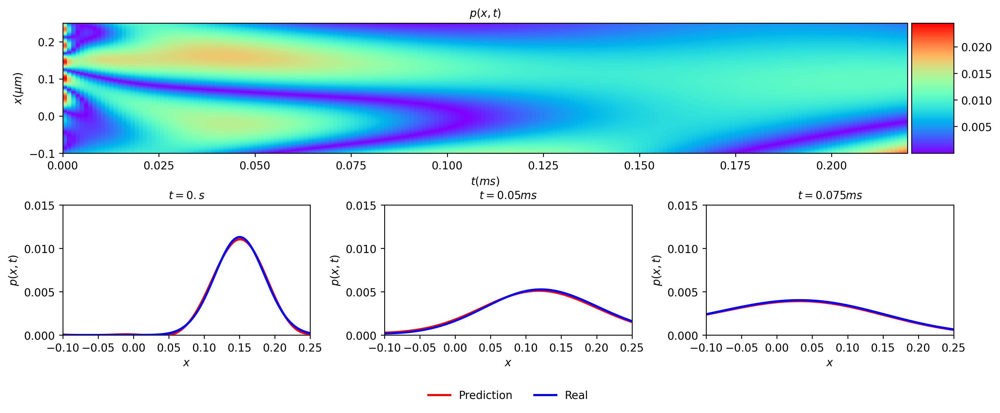

In [17]:
N_bc = 250 #Total number of boundary conditions points
N_ic = 250 #Total number of initial condition points
N_f = 1000 #Total number of collocation points

# Training data
x_f_train, x_bc_train, x_ic_train, p_ic_train, x_norm_instants, _, _, _, _ = trainingdata(N_bc, N_ic, N_f)

layers = np.array([2,20,20,20,20,20,20,20,20,1]) #8 hidden layers

pinn = PINN(layers,
            a=A,
            d=D)
prev_weights = np.loadtxt("./models/MODEL_WEIGHTS_IC100_BC100_f1000_t0.2197371130248822_iter25000_xLower-0.1_xUpper0.25_micrometers_miliseconds_k1e-7_r1e-20.txt")
pinn.set_weights(prev_weights)

p_pred = pinn.evaluate(X_p_test)
p_pred = np.reshape(p_pred,(N_x, N_steps),order='F')                        # Fortran Style ,stacked column wise!

''' Solution Plot '''
differenceplot(p_pred ,real.T)

In [92]:
def solutionplot(p_pred,X_p_train):#,p_train):
    
    fig, ax = plt.subplots(figsize=(10,10))
    ax.axis('off')

    gs0 = gridspec.GridSpec(1, 2)
    gs0.update(top=1-0.05, bottom=1-1/3, left=0.1, right=0.85, wspace=0)
    ax = plt.subplot(gs0[:, :])

    h = ax.imshow(p_pred, interpolation='nearest', cmap='rainbow', 
                extent=[T.min(), T.max(), X.min(), X.max()], 
                origin='lower', aspect='auto')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    fig.colorbar(h, cax=cax)
    
    #ax.plot(X_p_train[:,1], X_u_train[:,0], 'kx', label = 'Data (%d points)' % (u_train.shape[0]), markersize = 4, clip_on = False)

    #line = np.linspace(x.min(), x.max(), 2)[:,None]
    #ax.plot(t[25]*np.ones((2,1)), line, 'w-', linewidth = 1)
    #ax.plot(t[50]*np.ones((2,1)), line, 'w-', linewidth = 1)
    #ax.plot(t[75]*np.ones((2,1)), line, 'w-', linewidth = 1)    
    ax.axvline(x=t_upper, color="red")

    ax.set_xlabel('$t$')
    ax.set_ylabel('$x$')
    ax.legend(frameon=False, loc = 'best')
    ax.set_title('$p(x,t)$', fontsize = 10)

    
    
    ''' 
    Slices of the solution at points t = 0.25, t = 0.50 and t = 0.75
    '''
    
    ####### Row 1: u(t,x) slices ##################
    gs1 = gridspec.GridSpec(1, 3)
    gs1.update(top=1/2, bottom=0.05, left=0.2, right=0.8, wspace=0.5)

    ax = plt.subplot(gs1[0, 0])
    #ax.plot(x,usol.T[0,:], 'b-', linewidth = 2, label = 'Exact')       
    ax.plot(x,p_pred.T[0,:], 'r', linewidth = 2, label = 'Prediction')
    ax.set_xlabel('$x$')
    ax.set_ylabel('$u(x,t)$')    
    ax.set_title(f'$t = {t[0]}s$', fontsize = 10)
    #ax.axis('square')
    ax.set_xlim([x_lower - 0.1 ,x_upper + 0.1])
    ax.set_ylim([0,.015])

    ax = plt.subplot(gs1[0, 1])
    #ax.plot(x,usol.T[50,:], 'b-', linewidth = 2, label = 'Exact')       
    ax.plot(x,p_pred.T[50,:], 'r', linewidth = 2, label = 'Prediction')
    ax.set_xlabel('$x$')
    ax.set_ylabel('$u(x,t)$')
    #ax.axis('square')
    ax.set_xlim([x_lower - 0.1 ,x_upper + 0.1])
    ax.set_ylim([0,.015])
    #ax.set_title(f'$t = {t[int(t/2)]}s$', fontsize = 10)
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.35), ncol=5, frameon=False)

    ax = plt.subplot(gs1[0, 2])
    #ax.plot(x,usol.T[75,:], 'b-', linewidth = 2, label = 'Exact')       
    ax.plot(x,p_pred.T[75,:], 'r', linewidth = 2, label = 'Prediction')
    ax.set_xlabel('$x$')
    ax.set_ylabel('$p(x,t)$')
    #ax.axis('square')
    ax.set_xlim([x_lower - 0.1 ,x_upper + 0.1])
    ax.set_ylim([0,.015])    
    ax.set_title(f'$t = {t[-1]}s$', fontsize = 10)
    
    plt.tight_layout()
    #plt.savefig('Ornstein-Uhlenbeck.png',dpi = 500)
    

### Predictions

In [ ]:
N_bc = 100 #Total number of boundary conditions points
N_ic = 100 #Total number of initial condition points
N_f = 1000 #Total number of collocation points

# Training data
x_f_train, x_bc_train, x_ic_train, p_ic_train, x_norm_instants = trainingdata(N_bc, N_ic, N_f)

layers = np.array([2,20,20,20,20,20,20,20,20,1]) #8 hidden layers

pinn = PINN(layers, low_bound, up_bound,
                      x_ic_train, p_ic_train,
                      x_bc_train,
                      x_f_train,
                      x_norm_instants,
                      A=A,
                      D=D)

init_params = np.loadtxt("/Users/max/Documents/Lab_b/PINNs-Review/src/OUR CODE/models/MODEL_WEIGHTS_IC100_BC100_f1000_t0.2197371130248822_iter25000_xLower-0.1_xUpper0.25_micrometers_miliseconds_k1e-7_r1e-20.txt")
pinn.set_weights(init_params)
p_pred = pinn.evaluate(X_p_test)


p_pred = np.reshape(p_pred,(N_x,N_steps),order='F')
differenceplot(p_pred, real.T)

## A metric to test performances: KL-divergence
In order to quantify the distance in the space of probability density function we can use the KL-divergence and show how the distance between the PINN prediction and the numerical solution evolves in time.

In [11]:
def KL_divergence_over_time(prediction, numerical, t=t):
    #Recall prediction and numerical have shape (N_x,N_steps)
    KL=[]
    for i in range(len(t)):
        KL.append(np.dot(numerical[:,i], np.log(numerical[:,i]/prediction[:,i])))
    plt.figure(dpi=200)
    plt.plot(t,KL)
    plt.xlabel("t(ms)")
    plt.ylabel("$D(p_{num}||p_{pred})$")
    plt.legend()
    plt.show()
    return KL

-----------
Setting weights for _layers = array([ 2, 80, 70, 60, 50, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL2.8459e-08.txt', actfun = 'swish'
len(np.loadtxt('models/'+model)) = 17331
test_loss[-1] = 1.7303910610438517e-10


No handles with labels found to put in legend.


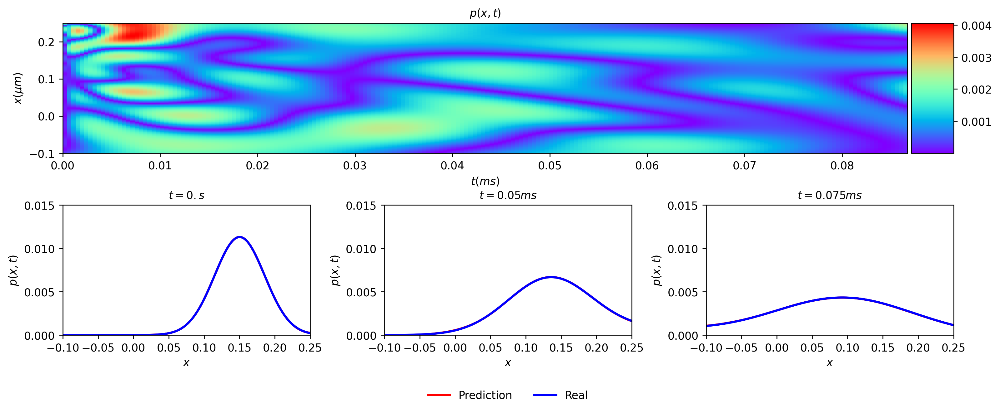

-----------
-----------
Setting weights for _layers = array([ 2, 80, 70, 60, 50, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL1.1875e-07.txt', actfun = 'swish'
len(np.loadtxt('models/'+model)) = 17331


No handles with labels found to put in legend.


test_loss[-1] = 4.982803868506351e-10


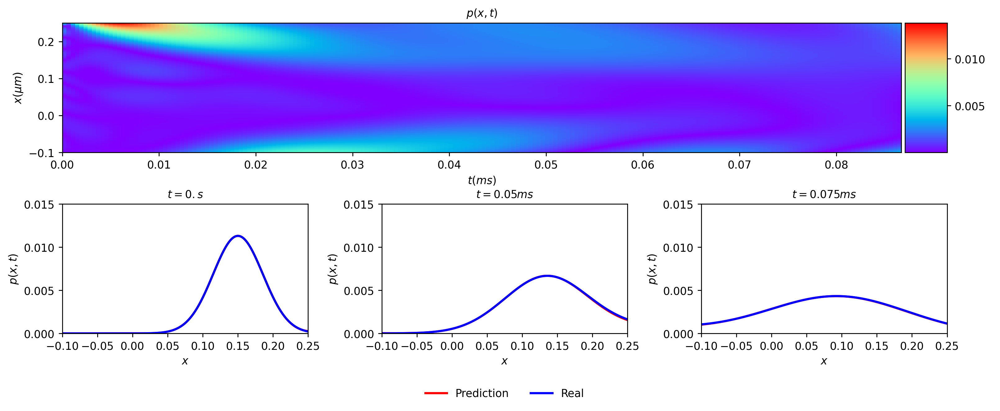

-----------
-----------
Setting weights for _layers = array([ 2, 20, 20, 20, 20, 20, 20, 20, 20,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL1.6950e-07.txt', actfun = 'tanh'
len(np.loadtxt('models/'+model)) = 3021
test_loss[-1] = 2.5720364201934233e-09


No handles with labels found to put in legend.


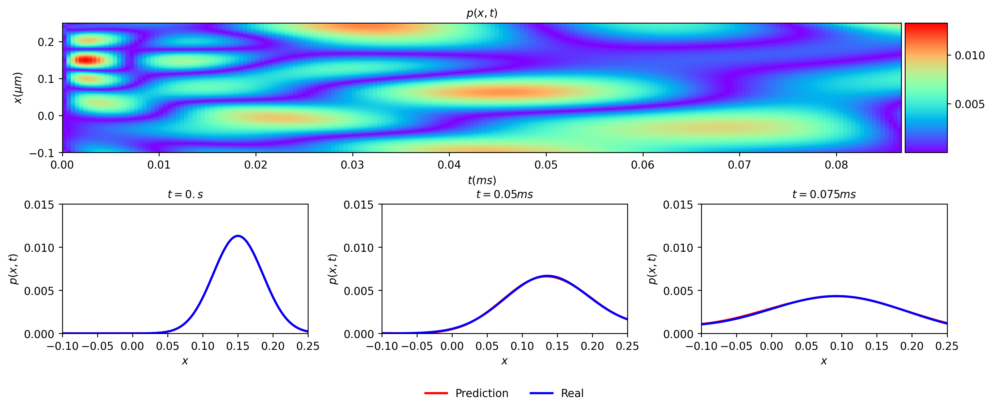

-----------
-----------
Setting weights for _layers = array([ 2, 60, 50, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL1.8616e-07.txt', actfun = 'tanh'
len(np.loadtxt('models/'+model)) = 7341


No handles with labels found to put in legend.


test_loss[-1] = 9.98212014974154e-10


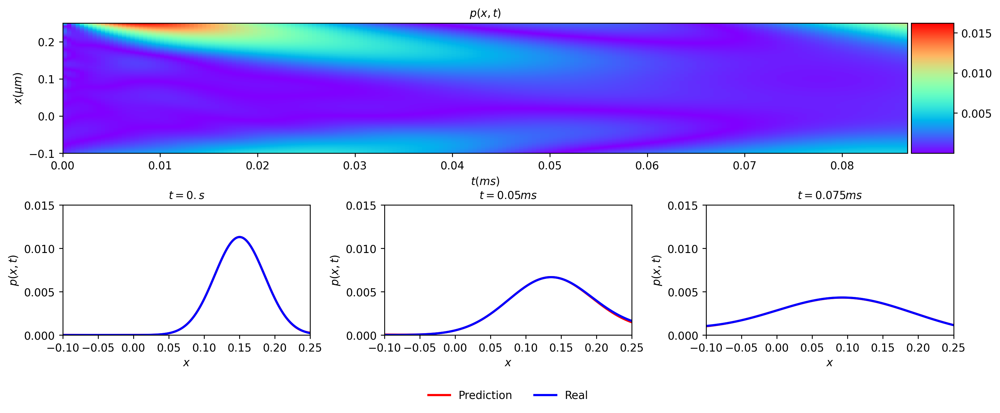

No handles with labels found to put in legend.


-----------
-----------
Setting weights for _layers = array([ 2, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL2.0535e-07.txt', actfun = 'tanh'
len(np.loadtxt('models/'+model)) = 2191
test_loss[-1] = 2.9165435096202034e-09


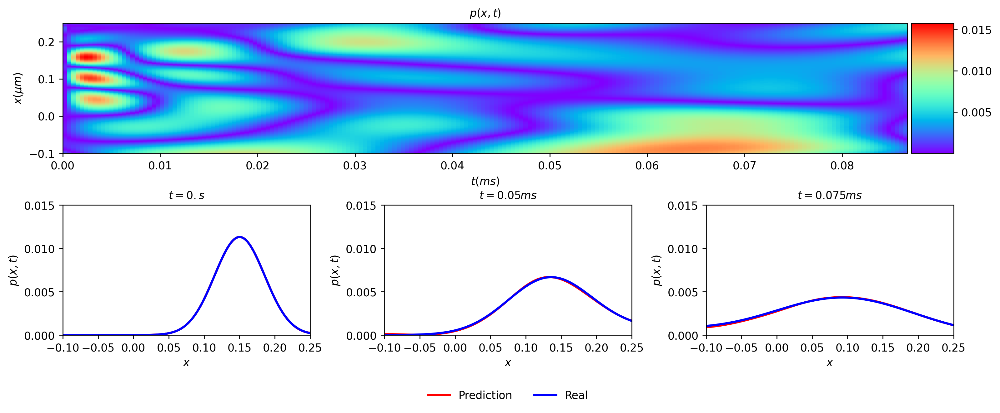

No handles with labels found to put in legend.


-----------
-----------
Setting weights for _layers = array([ 2, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL2.4607e-07.txt', actfun = 'swish'
len(np.loadtxt('models/'+model)) = 2191
test_loss[-1] = 2.3249734738391537e-09


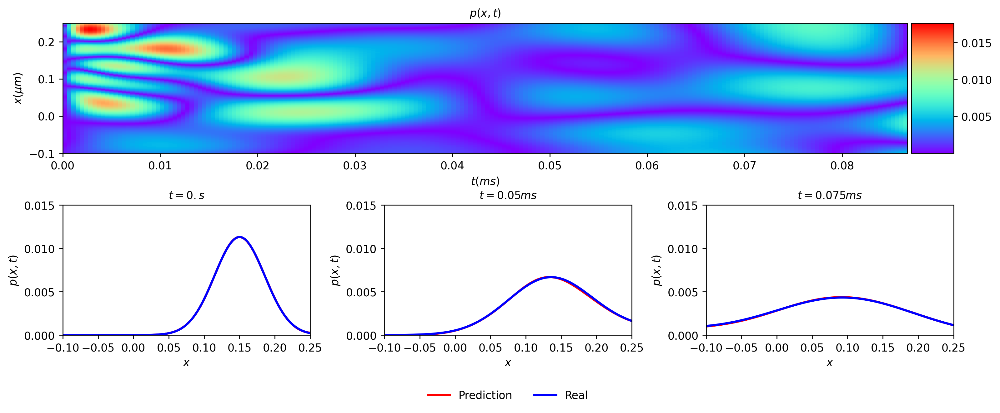

-----------
-----------
Setting weights for _layers = array([ 2, 80, 70, 60, 50, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL2.5368e-07.txt', actfun = 'tanh'
len(np.loadtxt('models/'+model)) = 17331


No handles with labels found to put in legend.


test_loss[-1] = 1.622180002349834e-09


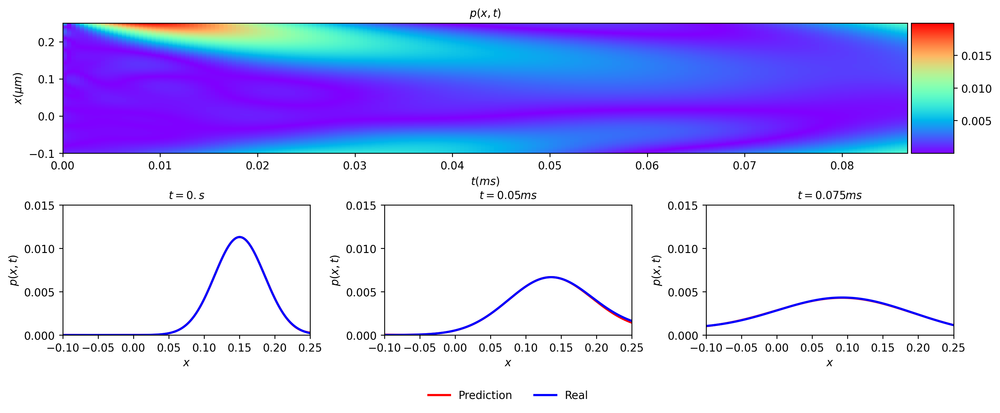

-----------
-----------
Setting weights for _layers = array([ 2, 80, 70, 60, 50, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL2.6549e-07.txt', actfun = 'swish'
len(np.loadtxt('models/'+model)) = 17331


No handles with labels found to put in legend.


test_loss[-1] = 2.6688727541598743e-10


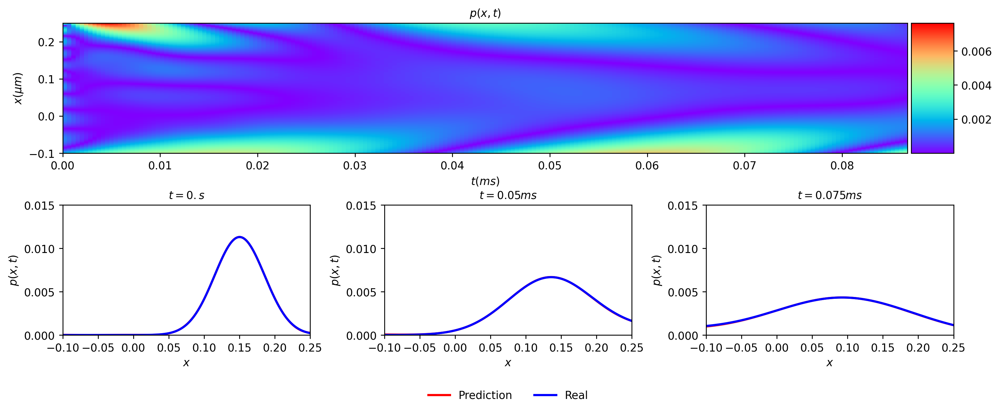

-----------
-----------
Setting weights for _layers = array([ 2, 80, 70, 60, 50, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL3.0578e-07.txt', actfun = 'tanh'
len(np.loadtxt('models/'+model)) = 17331


No handles with labels found to put in legend.


test_loss[-1] = 6.91282507249268e-09


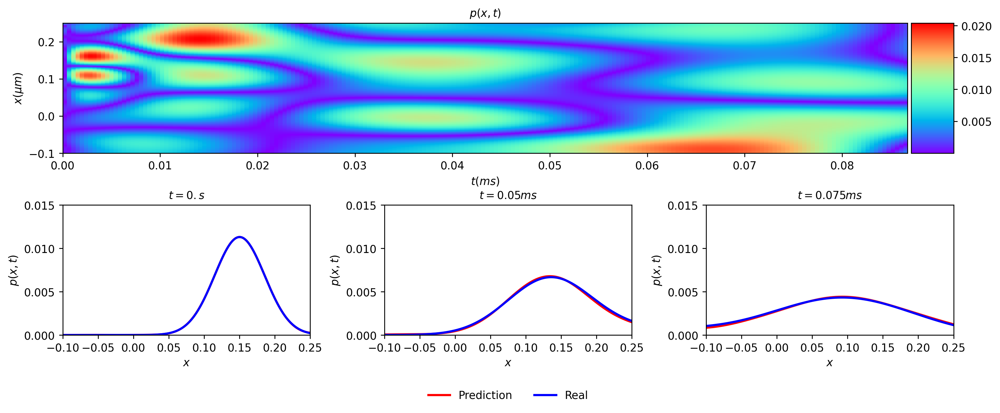

-----------
-----------
Setting weights for _layers = array([ 2, 20, 20, 20, 20, 20, 20, 20, 20,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL3.1299e-07.txt', actfun = 'tanh'
len(np.loadtxt('models/'+model)) = 3021


No handles with labels found to put in legend.


test_loss[-1] = 2.4505732272593623e-09


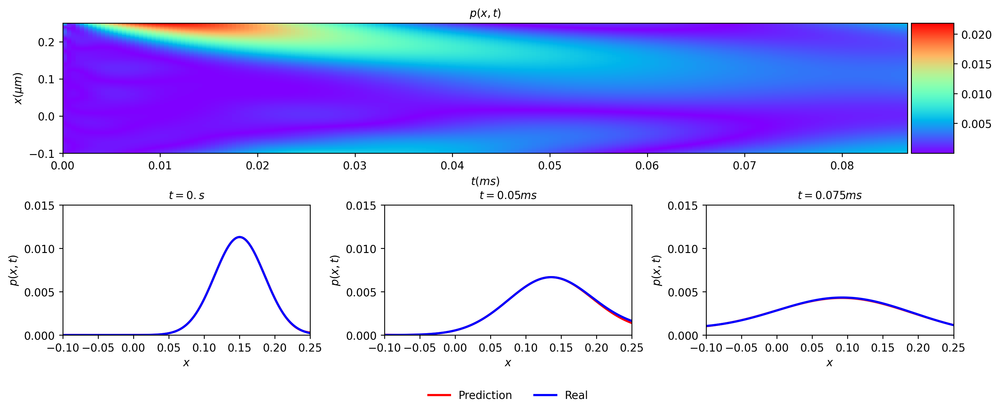

-----------
-----------
Setting weights for _layers = array([ 2, 60, 50, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL3.4546e-07.txt', actfun = 'swish'
len(np.loadtxt('models/'+model)) = 7341


No handles with labels found to put in legend.


test_loss[-1] = 2.0161724071501997e-10


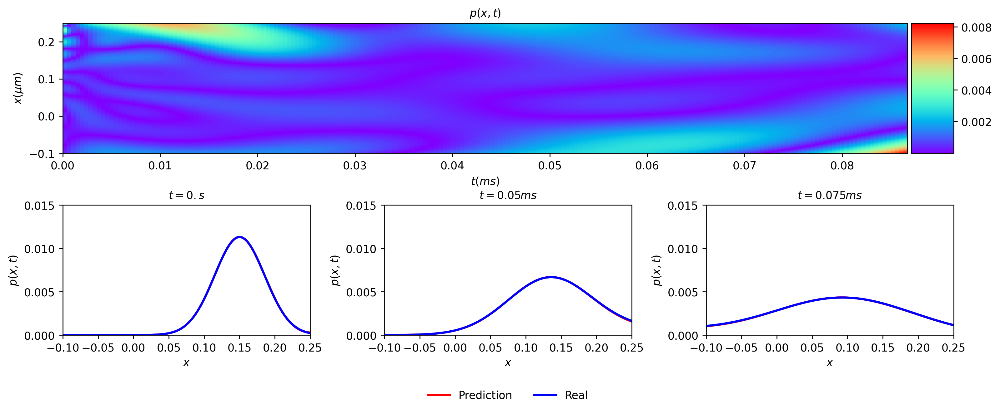

-----------
-----------
Setting weights for _layers = array([ 2, 60, 50, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL3.5758e-07.txt', actfun = 'swish'
len(np.loadtxt('models/'+model)) = 7341


No handles with labels found to put in legend.


test_loss[-1] = 3.125822105034207e-08


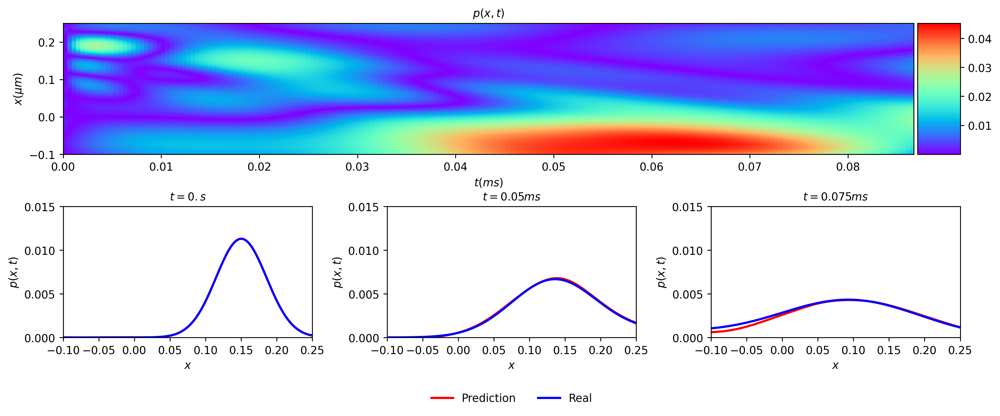

-----------
-----------
Setting weights for _layers = array([ 2, 20, 20, 20, 20, 20, 20,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL4.0787e-07.txt', actfun = 'tanh'
len(np.loadtxt('models/'+model)) = 2181
test_loss[-1] = 1.780867861154745e-08


No handles with labels found to put in legend.


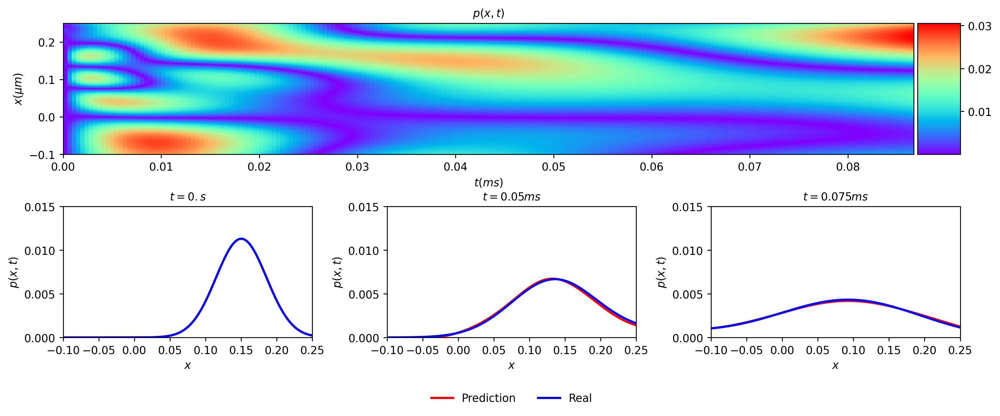

-----------
-----------
Setting weights for _layers = array([ 2, 20, 20, 20, 20, 20, 20, 20, 20,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL4.2987e-07.txt', actfun = 'swish'
len(np.loadtxt('models/'+model)) = 3021


No handles with labels found to put in legend.


test_loss[-1] = 1.2125895062284391e-09


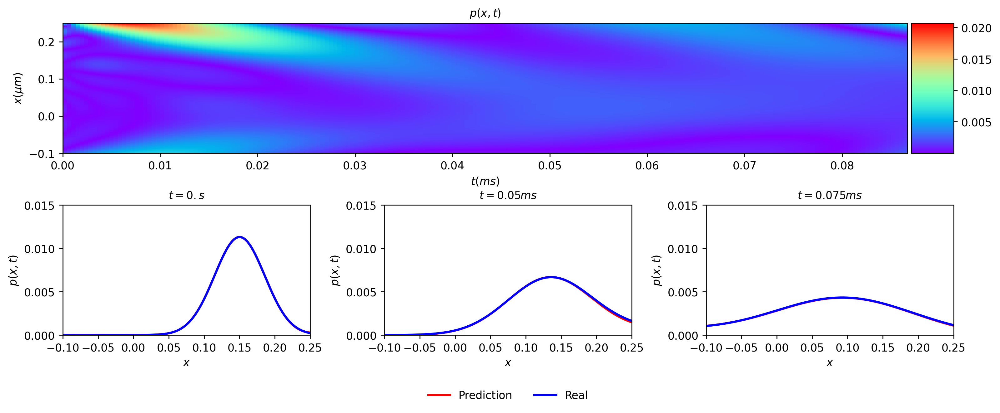

-----------
-----------
Setting weights for _layers = array([ 2, 20, 20, 20, 20, 20, 20,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL4.6248e-07.txt', actfun = 'tanh'
len(np.loadtxt('models/'+model)) = 2181


No handles with labels found to put in legend.


test_loss[-1] = 4.204593302578855e-09


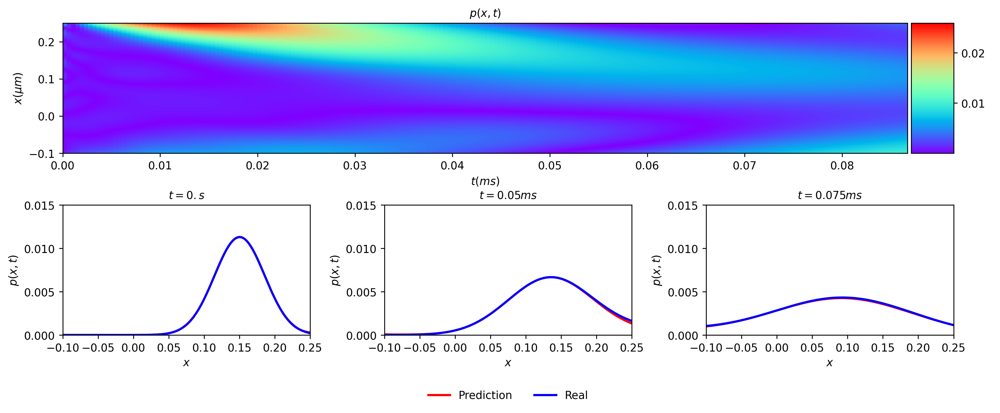

-----------
-----------
Setting weights for _layers = array([ 2, 20, 20, 20, 20, 20, 20,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL4.6606e-07.txt', actfun = 'swish'
len(np.loadtxt('models/'+model)) = 2181
test_loss[-1] = 4.380670912802357e-09


No handles with labels found to put in legend.


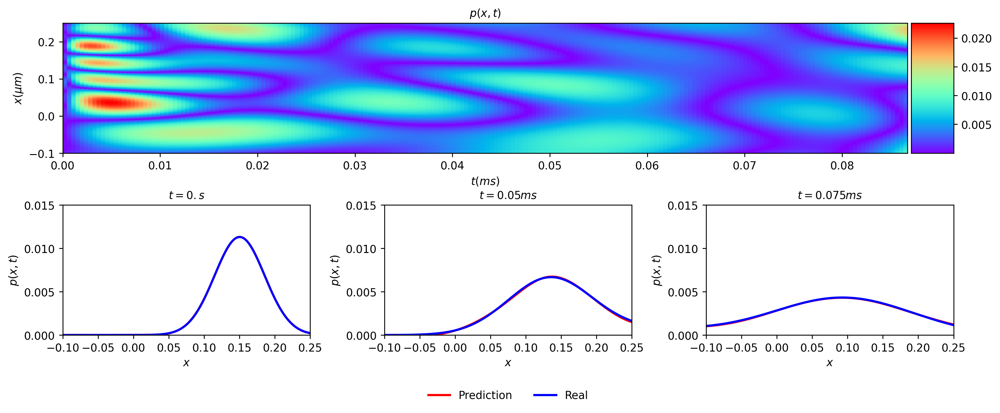

-----------
-----------
Setting weights for _layers = array([ 2, 20, 20, 20, 20, 20, 20,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL4.9408e-07.txt', actfun = 'swish'
len(np.loadtxt('models/'+model)) = 2181
test_loss[-1] = 1.1647869708096198e-09


No handles with labels found to put in legend.


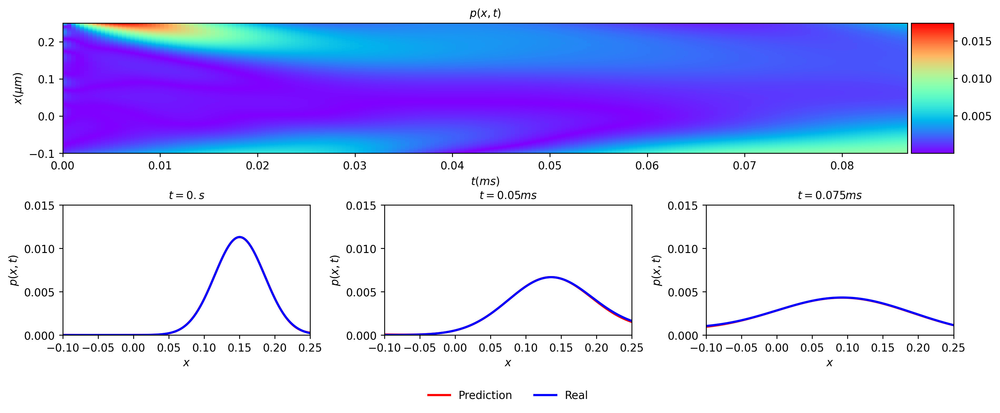

-----------
-----------
Setting weights for _layers = array([ 2, 20, 20, 20, 20, 20, 20,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL6.6776e-07.txt', actfun = 'swish'
len(np.loadtxt('models/'+model)) = 2181


No handles with labels found to put in legend.


test_loss[-1] = 1.8593040577732942e-09


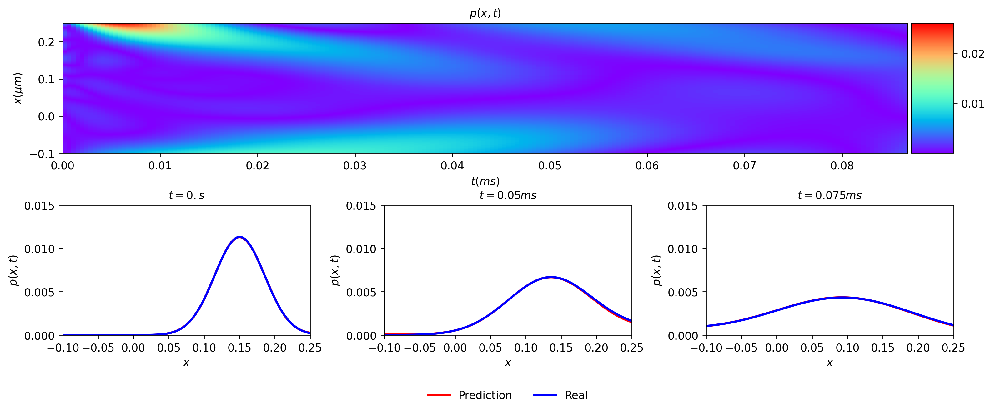

-----------
-----------
Setting weights for _layers = array([ 2, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL7.1878e-07.txt', actfun = 'tanh'
len(np.loadtxt('models/'+model)) = 2191
test_loss[-1] = 8.342795231245052e-10


No handles with labels found to put in legend.


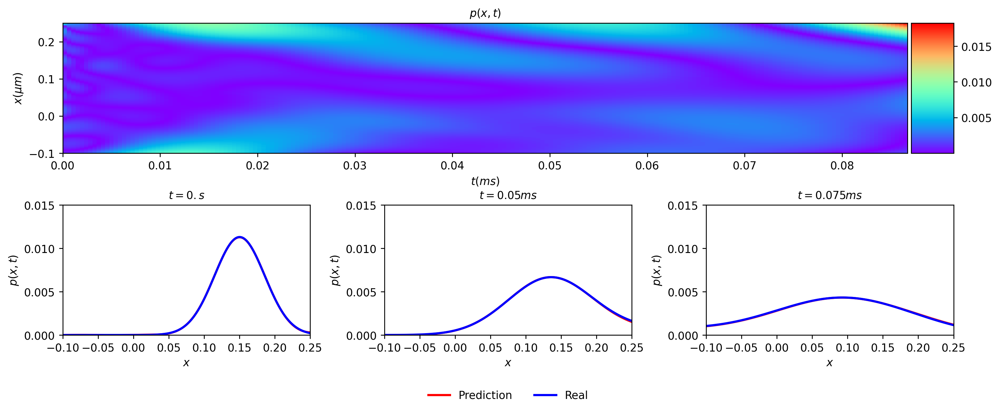

No handles with labels found to put in legend.


-----------
-----------
Setting weights for _layers = array([ 2, 20, 20, 20, 20,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL8.0359e-07.txt', actfun = 'swish'
len(np.loadtxt('models/'+model)) = 1341
test_loss[-1] = 9.095141864677773e-09


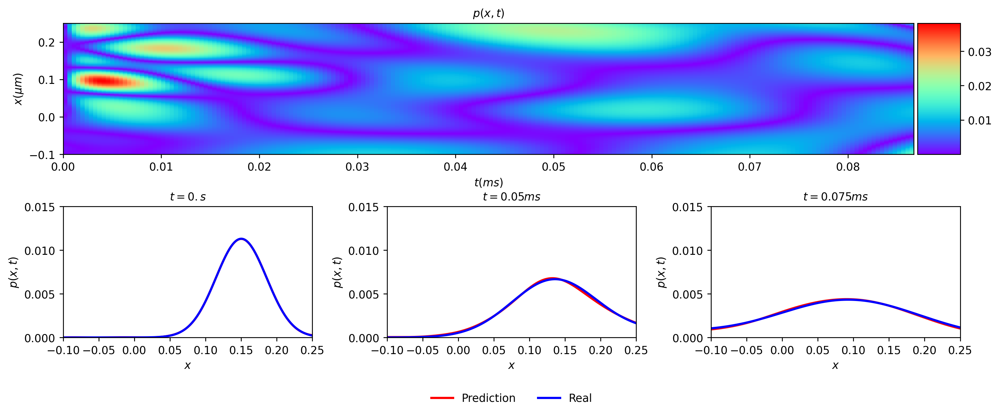

-----------
-----------
Setting weights for _layers = array([ 2, 60, 50, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL8.1418e-07.txt', actfun = 'tanh'
len(np.loadtxt('models/'+model)) = 7341


No handles with labels found to put in legend.


test_loss[-1] = 1.8472939886557268e-08


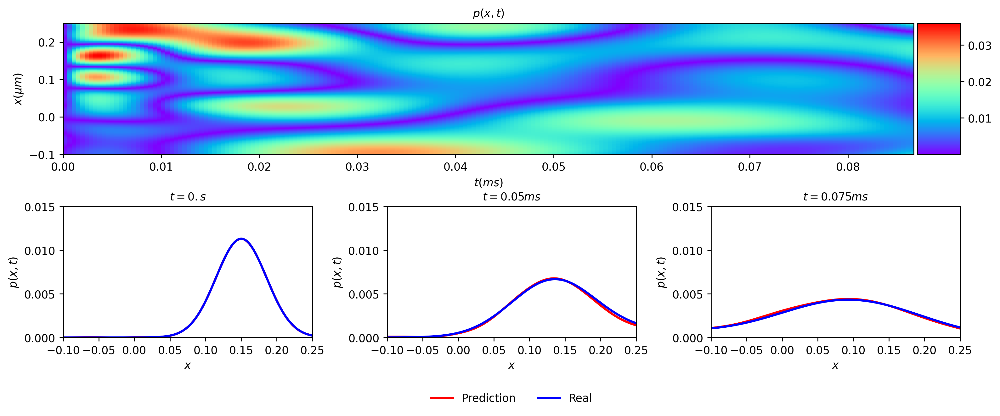

No handles with labels found to put in legend.


-----------
-----------
Setting weights for _layers = array([ 2, 20, 20, 20, 20,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL8.1681e-07.txt', actfun = 'tanh'
len(np.loadtxt('models/'+model)) = 1341
test_loss[-1] = 2.1014477969608803e-09


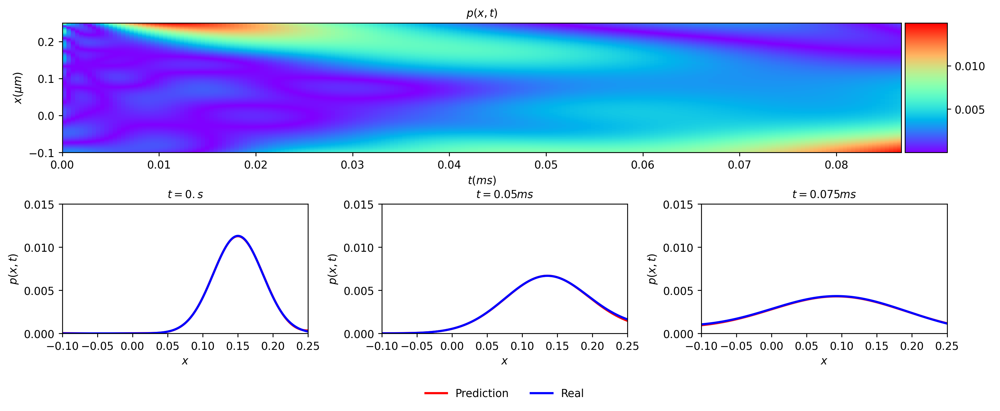

-----------


In [73]:
best_models = ["MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL2.8459e-08.txt",
                "MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL1.1875e-07.txt",
                "MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL1.6950e-07.txt",
                "MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL1.8616e-07.txt",
                "MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL2.0535e-07.txt",
                "MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL2.4607e-07.txt",
                "MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL2.5368e-07.txt",
                "MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL2.6549e-07.txt",
                "MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL3.0578e-07.txt",
                "MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL3.1299e-07.txt",
                "MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL3.4546e-07.txt",
                "MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL3.5758e-07.txt",
                "MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL4.0787e-07.txt",
                "MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL4.2987e-07.txt",
                "MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL4.6248e-07.txt",
                "MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL4.6606e-07.txt",
                "MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL4.9408e-07.txt",
                "MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL6.6776e-07.txt",
                "MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL7.1878e-07.txt",
                "MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL8.0359e-07.txt",
                "MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL8.1418e-07.txt",
                "MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL8.1681e-07.txt"]
best_layers = [np.array([2,80,70,60,50,40,30,20,10,1]),
               np.array([2,80,70,60,50,40,30,20,10,1]),
               np.array([2,20,20,20,20,20,20,20,20,1]),
               np.array([2,60,50,40,30,20,10,1]),
               np.array([2,40,30,20,10,1]),
               np.array([2,40,30,20,10,1]),
               np.array([2,80,70,60,50,40,30,20,10,1]),
               np.array([2,80,70,60,50,40,30,20,10,1]),
               np.array([2,80,70,60,50,40,30,20,10,1]),
               np.array([2,20,20,20,20,20,20,20,20,1]),
               np.array([2,60,50,40,30,20,10,1]),
               np.array([2,60,50,40,30,20,10,1]),
               np.array([2,20,20,20,20,20,20,1]),
               np.array([2,20,20,20,20,20,20,20,20,1]),
               np.array([2,20,20,20,20,20,20,1]),
               np.array([2,20,20,20,20,20,20,1]),
               np.array([2,20,20,20,20,20,20,1]),
               np.array([2,20,20,20,20,20,20,1]),
               np.array([2,40,30,20,10,1]),
               np.array([2,20,20,20,20,1]),
               np.array([2,60,50,40,30,20,10,1]),
               np.array([2,20,20,20,20,1])]
best_actfun = ["swish",
               "swish",
               "tanh",
               "tanh",
               "tanh",
               "swish",
               "tanh",
               "swish",
               "tanh",
               "tanh",
               "swish",
               "swish",
               "tanh",
               "swish",
               "tanh",
               "swish",
               "swish",
               "swish",
               "tanh",
               "swish",
               "tanh",
               "tanh"]
kullback_leiblen_divergences = []
test_loss = []
for _layers, model, actfun in zip(best_layers, best_models, best_actfun):
    print("-----------")
    pinn = PINN(_layers,
                activation_function=actfun,
                a=A,
                d=D)
    print(f"Setting weights for {_layers = }, {model = }, {actfun = }")
    print(f"{len(np.loadtxt('models/'+model)) = }")
    pinn.set_weights(np.loadtxt("models/" + model))
    p_pred = pinn.evaluate(X_p_test)
    p_pred = np.reshape(p_pred,(N_x,N_steps),order='F')
    #for i in range(N_steps):
    #    kullback_leiblen_divergences.append(np.dot(real[i,:].T, np.log(real[i,:].T/p_pred[:,i])))
    #print(f"{kullback_leiblen_divergences = }")
    test_loss.append(np.mean((p_pred - real.T) ** 2))
    print(f"{test_loss[-1] = }")
    kullback_leiblen_divergences = []
    differenceplot(p_pred, real.T)
    plt.show()
    print("-----------")

Best model:
	[ 2 80 70 60 50 40 30 20 10  1]
	swish
test_loss[j] = 1.7303910610438517e-10


No handles with labels found to put in legend.


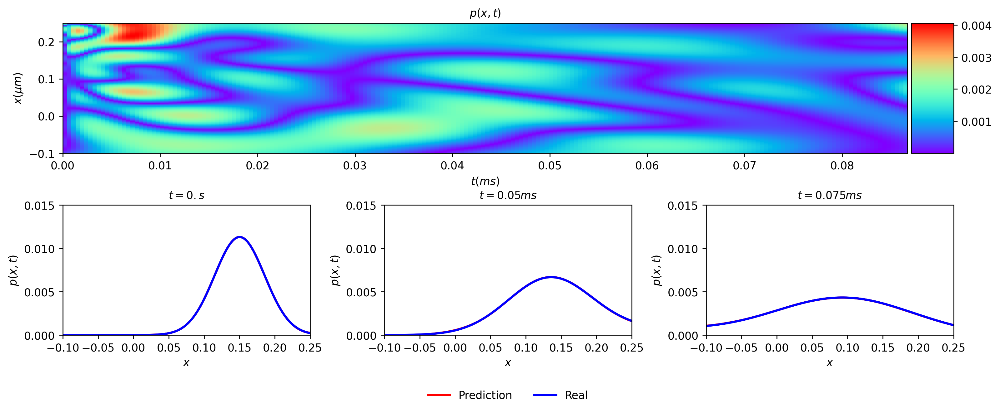

In [74]:
j = np.argmin(test_loss)
print("Best model:")
print(f"\t{best_layers[j]}")
print(f"\t{best_actfun[j]}")
print(f"{test_loss[j] = }")
pinn = PINN(best_layers[j],
            activation_function=best_actfun[j],
            a=A,
            d=D)
pinn.set_weights(np.loadtxt("models/" + best_models[j]))
p_pred = pinn.evaluate(X_p_test)
p_pred = np.reshape(p_pred,(N_x,N_steps),order='F')
differenceplot(p_pred, real.T)
plt.show()

No handles with labels found to put in legend.
/var/folders/2j/yj3x01td2lqbznzlbwcpz1pc0000gn/T/ipykernel_1193/4161290058.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
No handles with labels found to put in legend.
/var/folders/2j/yj3x01td2lqbznzlbwcpz1pc0000gn/T/ipykernel_1193/4161290058.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


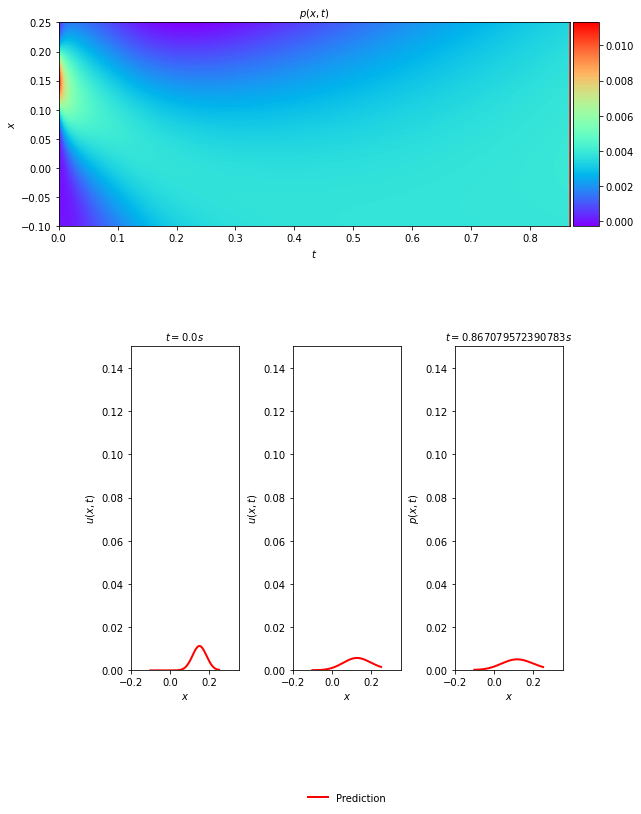

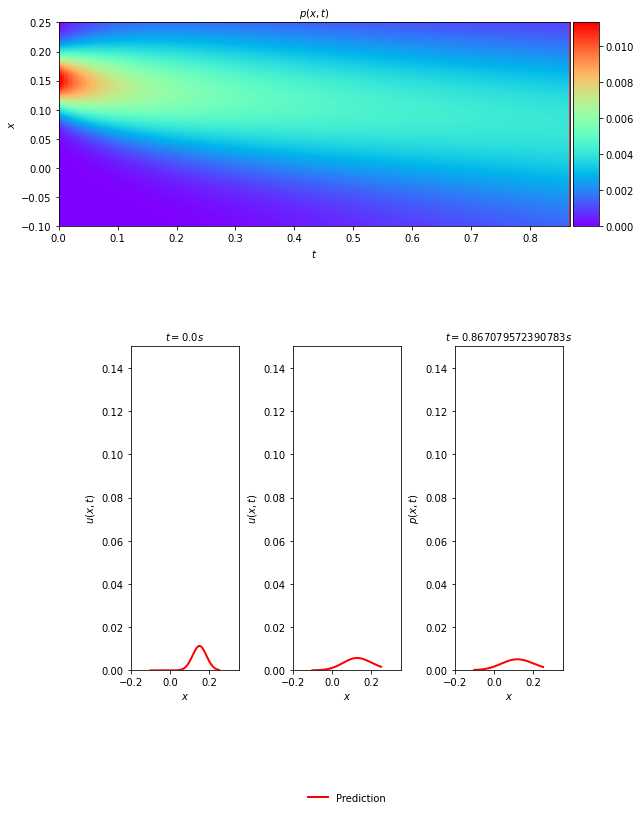

In [90]:
solutionplot(p_pred, X_p_test)
solutionplot(real.T, X_p_test)

## Prediction for large t

-----------
Setting weights for _layers = array([ 2, 80, 70, 60, 50, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL2.8459e-08.txt', actfun = 'swish'


No handles with labels found to put in legend.


test_loss[-1] = 0.0005931379769870893


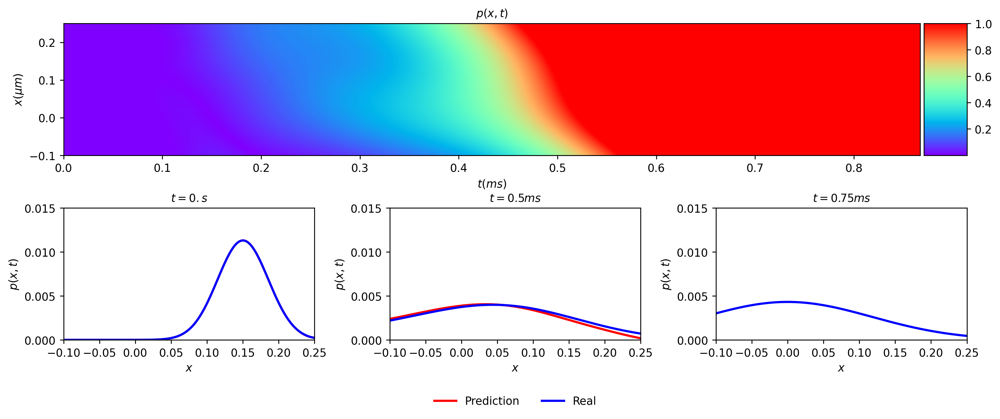

-----------
-----------
Setting weights for _layers = array([ 2, 80, 70, 60, 50, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL1.1875e-07.txt', actfun = 'swish'


No handles with labels found to put in legend.


test_loss[-1] = 0.010917513377565182


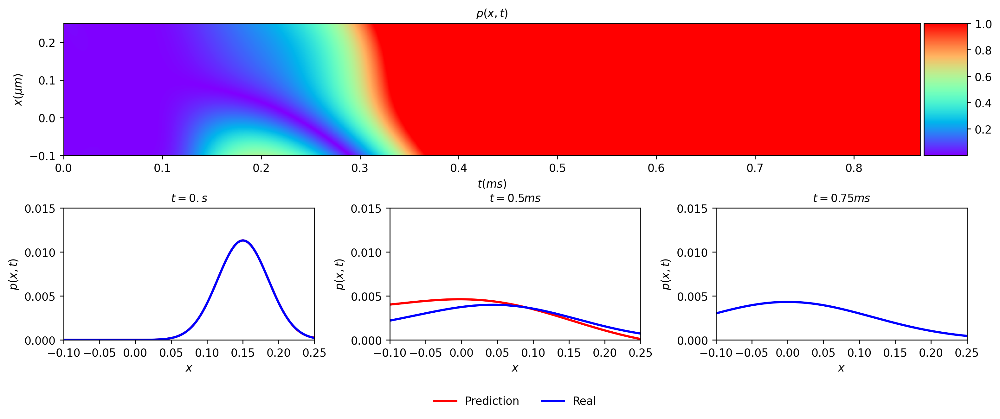

-----------
-----------
Setting weights for _layers = array([ 2, 20, 20, 20, 20, 20, 20, 20, 20,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL1.6950e-07.txt', actfun = 'tanh'


No handles with labels found to put in legend.


test_loss[-1] = 0.0009400970977349084


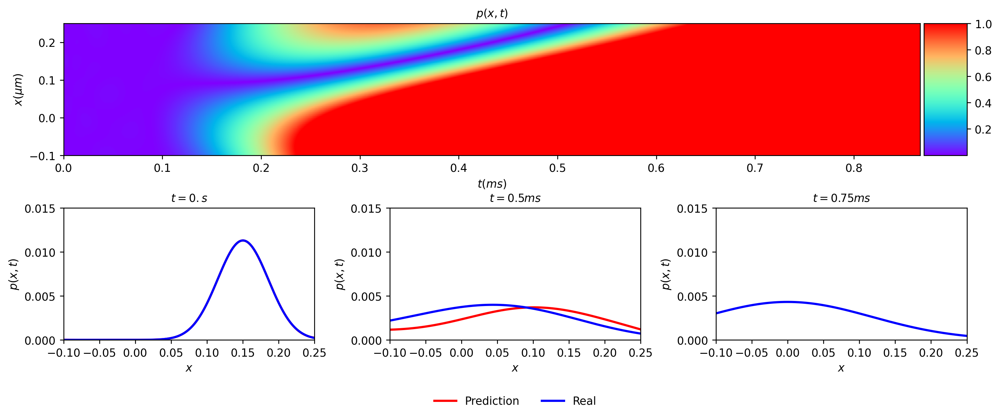

-----------
-----------
Setting weights for _layers = array([ 2, 60, 50, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL1.8616e-07.txt', actfun = 'tanh'


No handles with labels found to put in legend.


test_loss[-1] = 5.903552241365816e-07


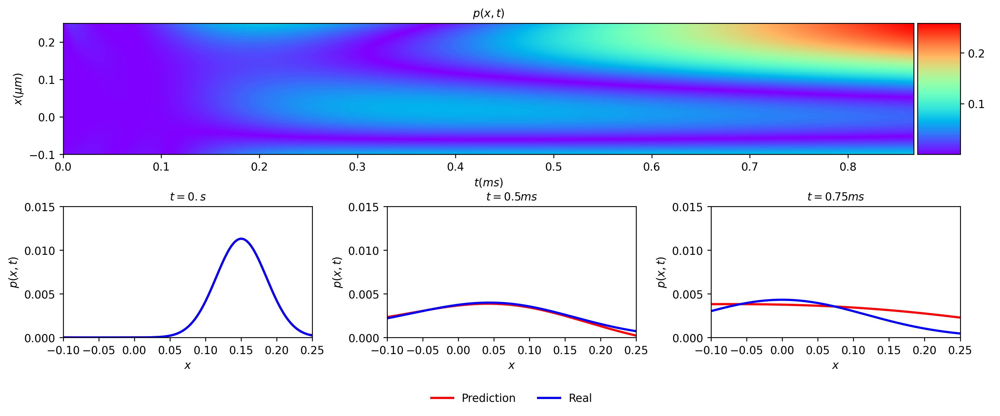

-----------
-----------
Setting weights for _layers = array([ 2, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL2.0535e-07.txt', actfun = 'tanh'


No handles with labels found to put in legend.


test_loss[-1] = 0.0002475710223511351


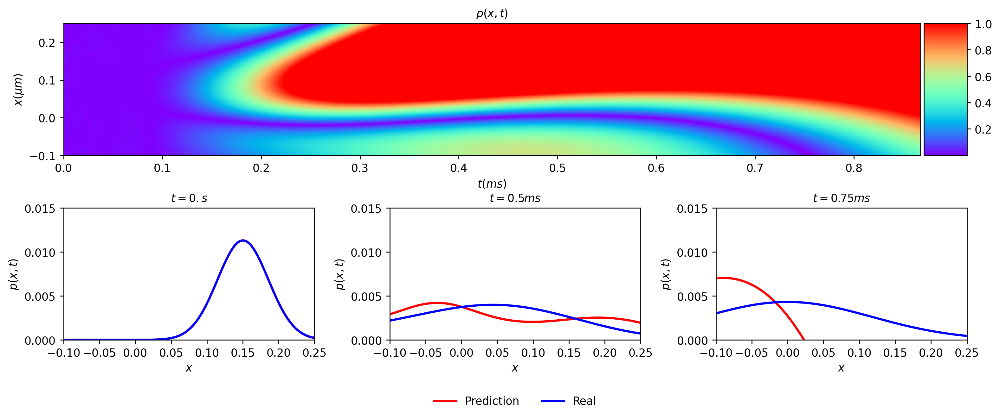

-----------
-----------
Setting weights for _layers = array([ 2, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL2.4607e-07.txt', actfun = 'swish'


No handles with labels found to put in legend.


test_loss[-1] = 1.3653347028735268


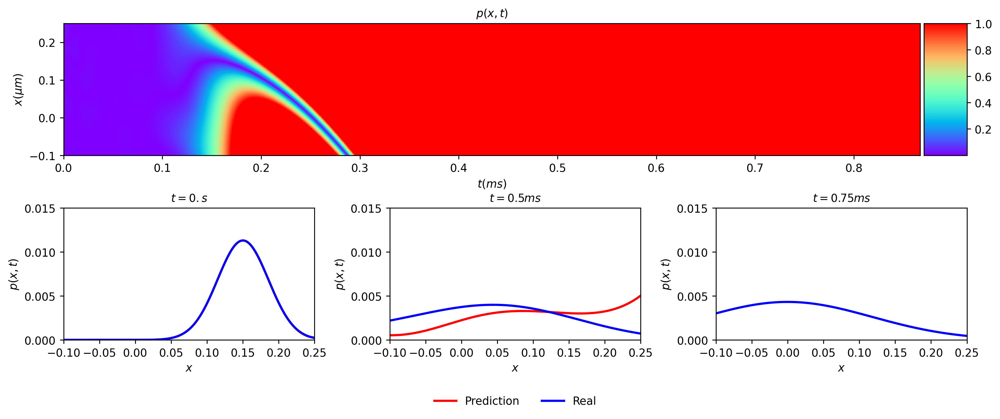

-----------
-----------
Setting weights for _layers = array([ 2, 80, 70, 60, 50, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL2.5368e-07.txt', actfun = 'tanh'


No handles with labels found to put in legend.


test_loss[-1] = 0.00023630945445789585


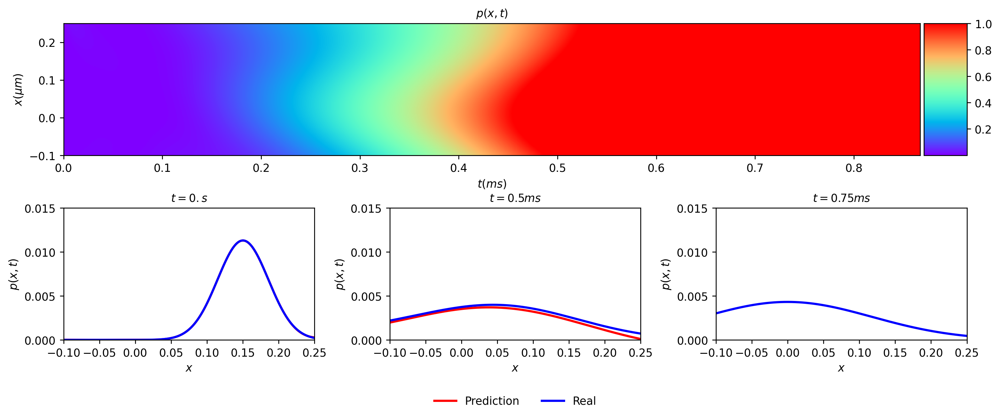

-----------
-----------
Setting weights for _layers = array([ 2, 80, 70, 60, 50, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL2.6549e-07.txt', actfun = 'swish'


No handles with labels found to put in legend.


test_loss[-1] = 0.08740698765447066


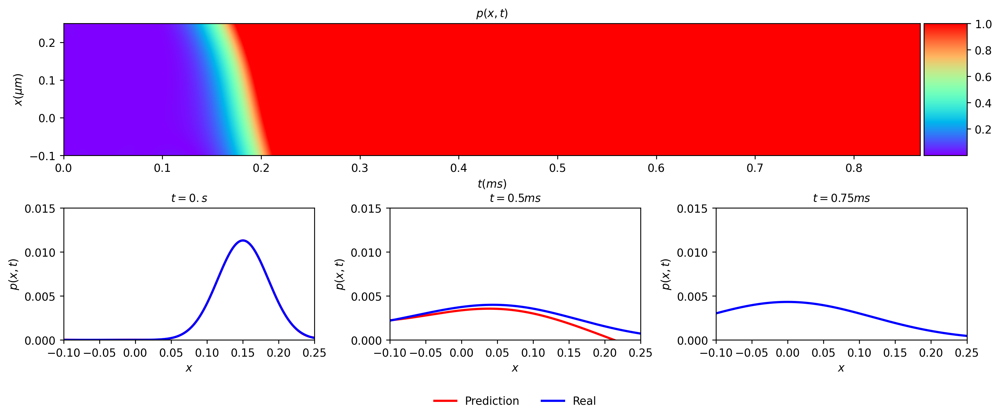

-----------
-----------
Setting weights for _layers = array([ 2, 80, 70, 60, 50, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL3.0578e-07.txt', actfun = 'tanh'


No handles with labels found to put in legend.


test_loss[-1] = 4.1363043376799084e-05


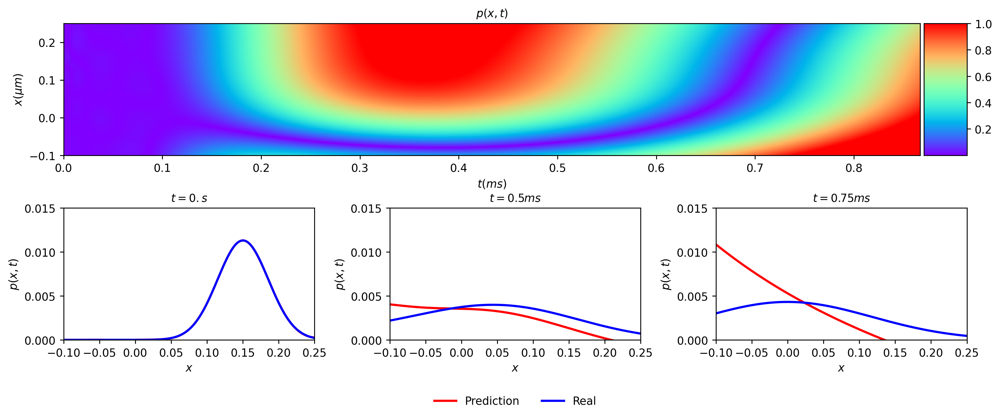

-----------
-----------
Setting weights for _layers = array([ 2, 20, 20, 20, 20, 20, 20, 20, 20,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL3.1299e-07.txt', actfun = 'tanh'


No handles with labels found to put in legend.


test_loss[-1] = 2.759577668381424e-05


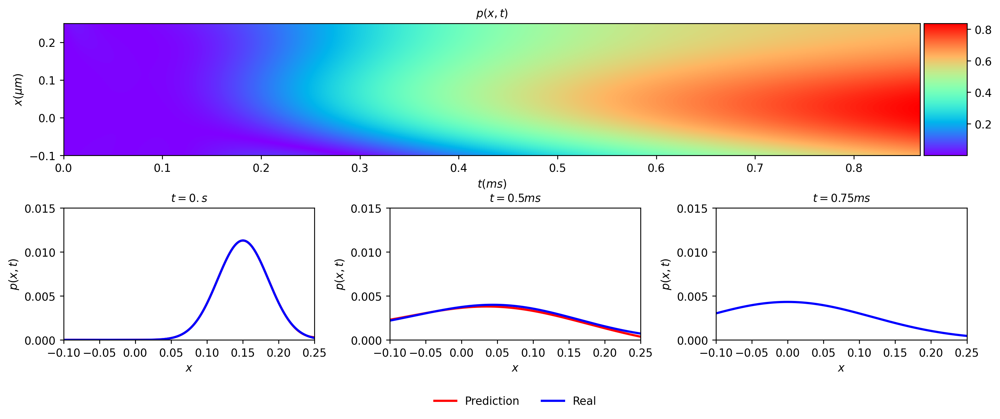

-----------
-----------
Setting weights for _layers = array([ 2, 60, 50, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL3.4546e-07.txt', actfun = 'swish'


No handles with labels found to put in legend.


test_loss[-1] = 0.011968035049694518


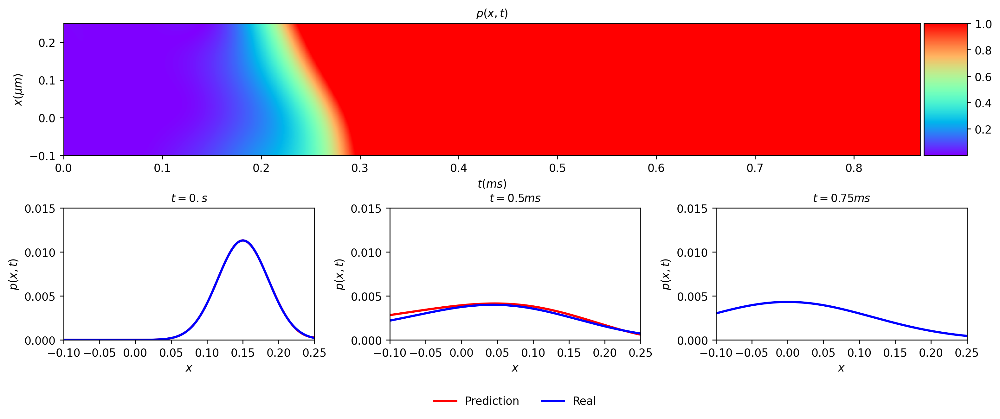

-----------
-----------
Setting weights for _layers = array([ 2, 60, 50, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL3.5758e-07.txt', actfun = 'swish'


No handles with labels found to put in legend.


test_loss[-1] = 0.008449662547732384


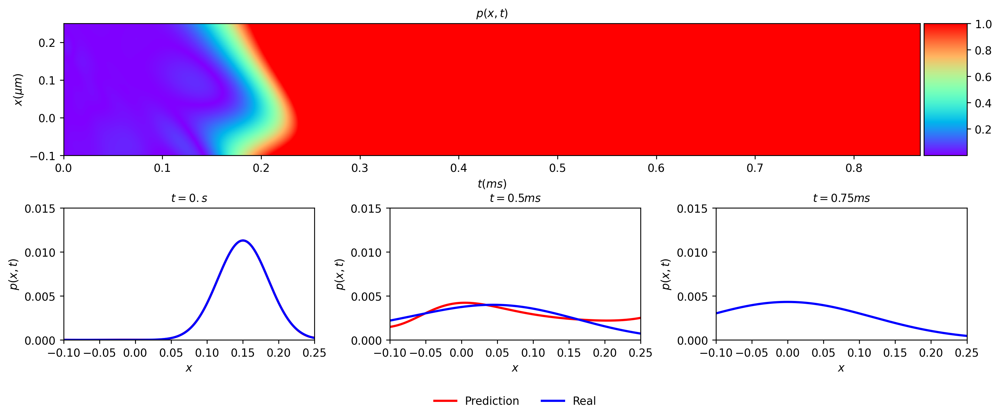

-----------
-----------
Setting weights for _layers = array([ 2, 20, 20, 20, 20, 20, 20,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL4.0787e-07.txt', actfun = 'tanh'


No handles with labels found to put in legend.


test_loss[-1] = 9.055746872323424e-05


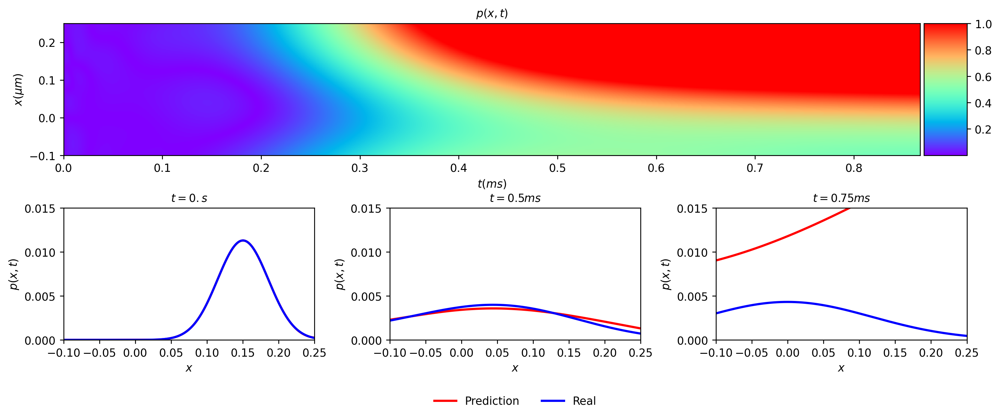

-----------
-----------
Setting weights for _layers = array([ 2, 20, 20, 20, 20, 20, 20, 20, 20,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL4.2987e-07.txt', actfun = 'swish'


No handles with labels found to put in legend.


test_loss[-1] = 0.5105571338870993


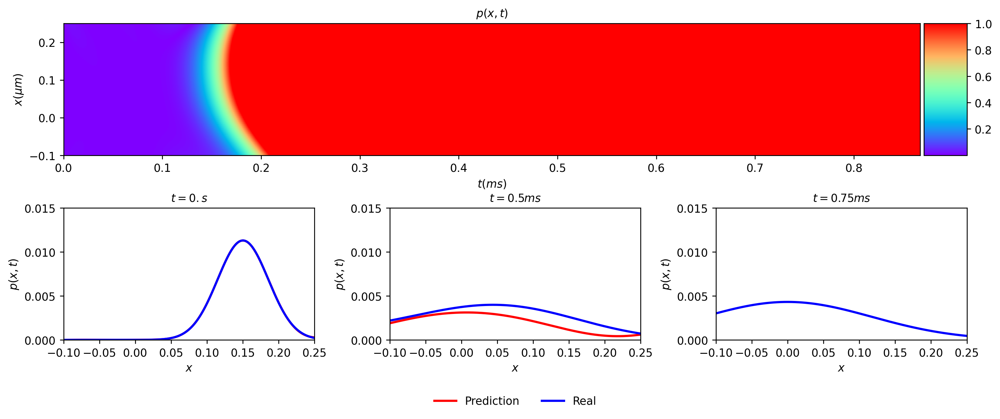

-----------
-----------
Setting weights for _layers = array([ 2, 20, 20, 20, 20, 20, 20,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL4.6248e-07.txt', actfun = 'tanh'


No handles with labels found to put in legend.


test_loss[-1] = 6.124161735296671e-06


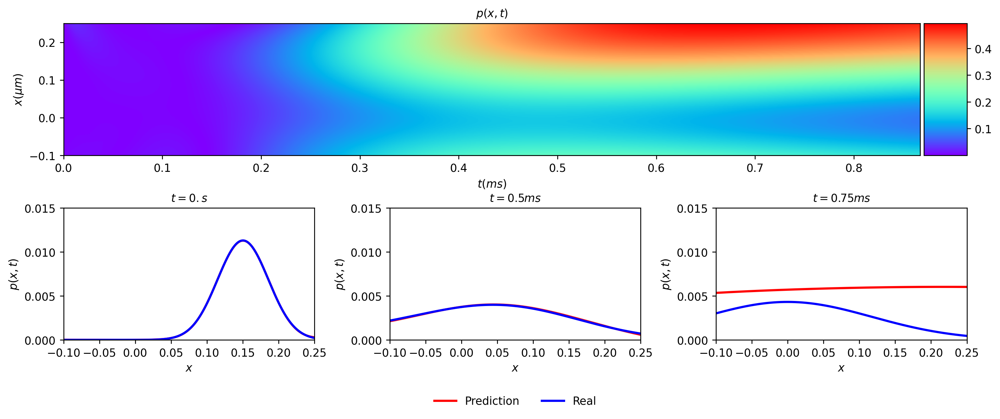

-----------
-----------
Setting weights for _layers = array([ 2, 20, 20, 20, 20, 20, 20,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL4.6606e-07.txt', actfun = 'swish'


No handles with labels found to put in legend.


test_loss[-1] = 0.08304953909333677


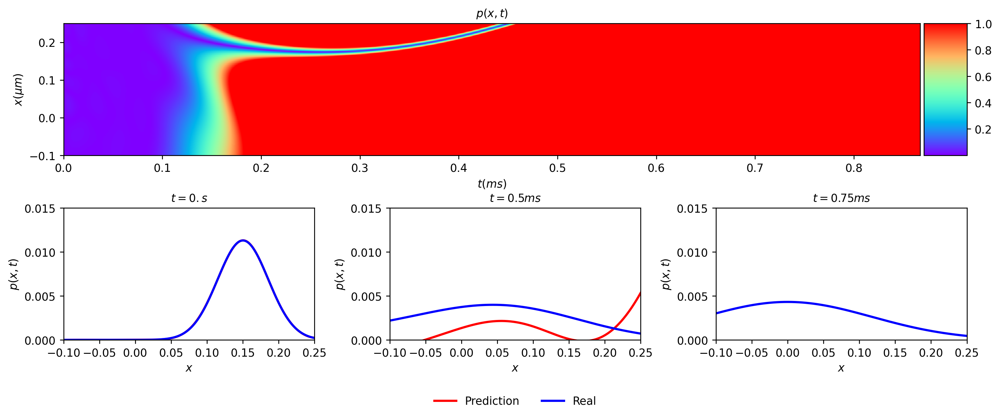

-----------
-----------
Setting weights for _layers = array([ 2, 20, 20, 20, 20, 20, 20,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL4.9408e-07.txt', actfun = 'swish'


No handles with labels found to put in legend.


test_loss[-1] = 0.0368143697279657


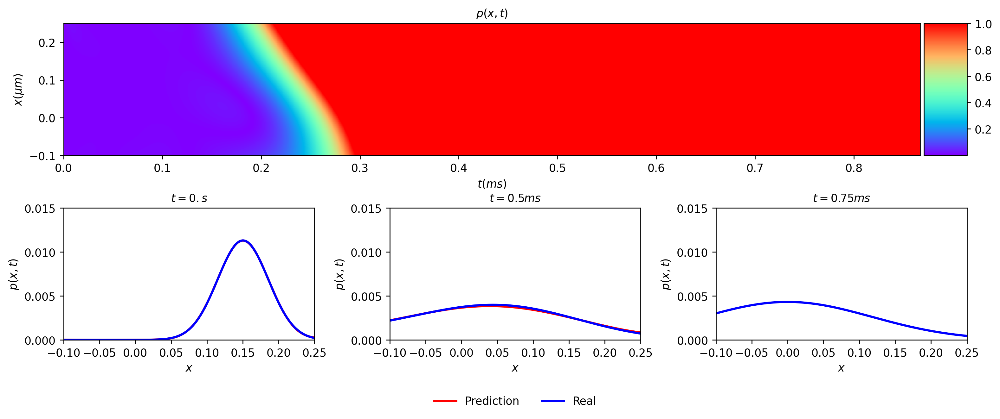

-----------
-----------
Setting weights for _layers = array([ 2, 20, 20, 20, 20, 20, 20,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL6.6776e-07.txt', actfun = 'swish'


No handles with labels found to put in legend.


test_loss[-1] = 0.009835087531765298


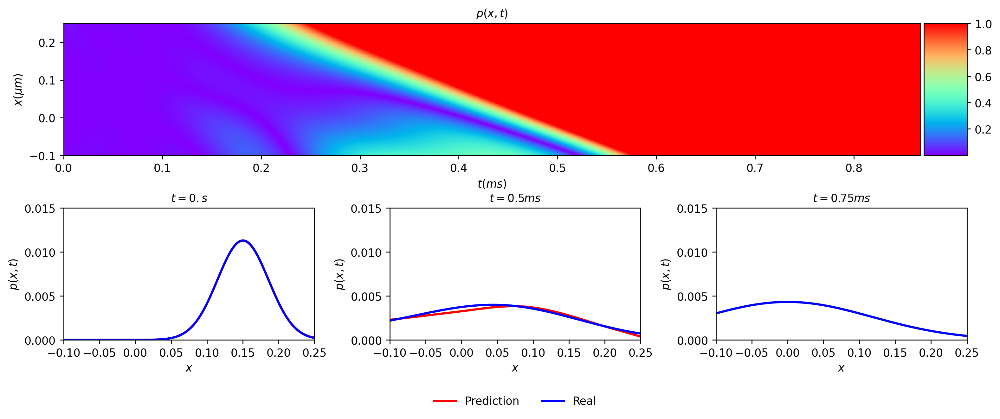

-----------
-----------
Setting weights for _layers = array([ 2, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL7.1878e-07.txt', actfun = 'tanh'


No handles with labels found to put in legend.


test_loss[-1] = 0.0003686084746696083


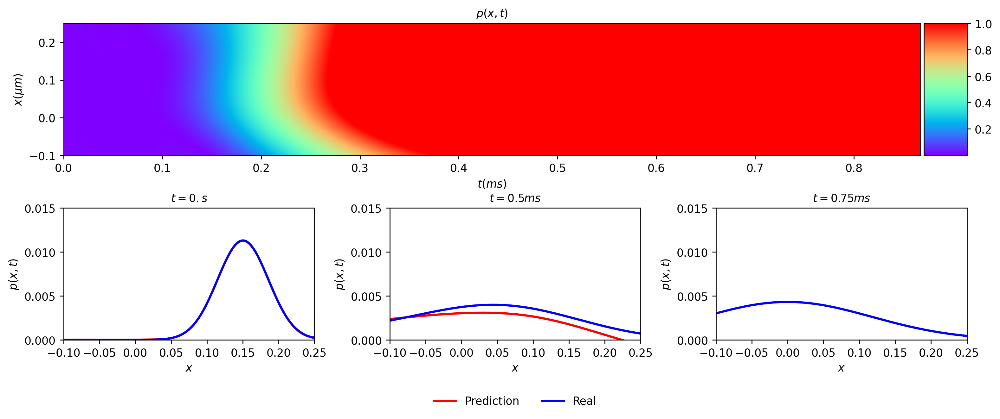

-----------
-----------
Setting weights for _layers = array([ 2, 20, 20, 20, 20,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL8.0359e-07.txt', actfun = 'swish'


No handles with labels found to put in legend.


test_loss[-1] = 4.699574089204027


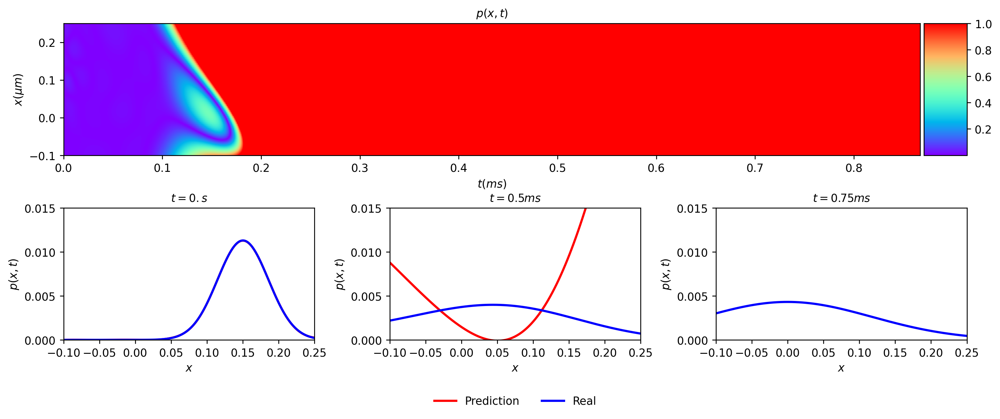

-----------
-----------
Setting weights for _layers = array([ 2, 60, 50, 40, 30, 20, 10,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL8.1418e-07.txt', actfun = 'tanh'


No handles with labels found to put in legend.


test_loss[-1] = 0.00020060365317665446


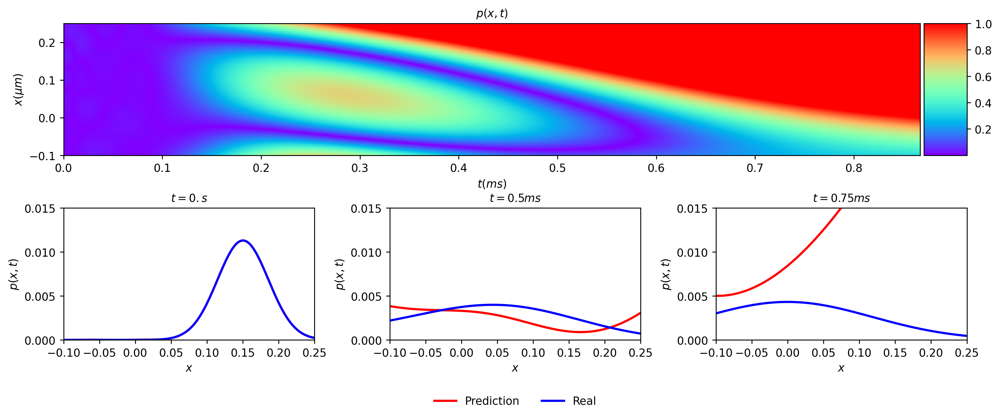

-----------
-----------
Setting weights for _layers = array([ 2, 20, 20, 20, 20,  1]), model = 'MODEL_WEIGHTS_IC157_BC90_f35000_t0.0867_iter7500_GridSearch_VL8.1681e-07.txt', actfun = 'tanh'


No handles with labels found to put in legend.


test_loss[-1] = 7.854650721739854e-05


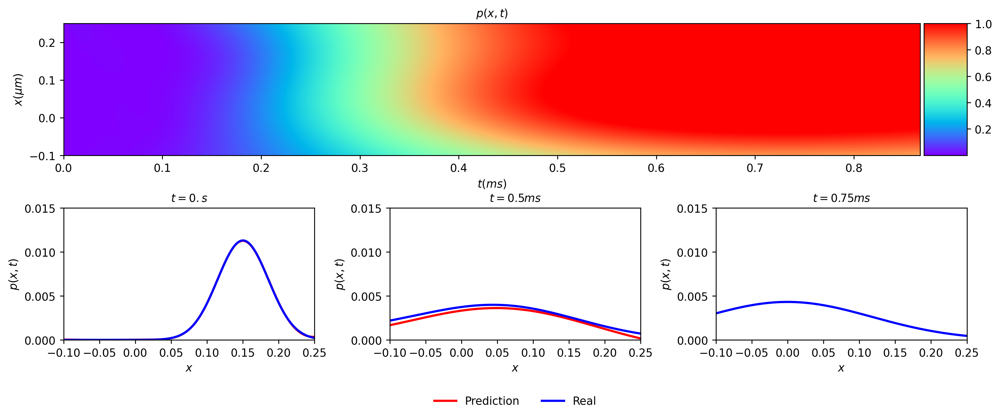

-----------


In [93]:
large_t_real = pickle.load(open('./simulations/large_t_numerical_solution.sav', 'rb'))
t_upper = 6.9 / A
_t = np.linspace(t_lower, t_upper, N_steps * 10)
_X, _T = np.meshgrid(x, t)
X_p_test = np.hstack((_X.flatten()[:, None], _T.flatten()[:, None]))
test_loss = []
for _layers, model, actfun in zip(best_layers, best_models, best_actfun):
    print("-----------")
    print(f"Setting weights for {_layers = }, {model = }, {actfun = }")
    pinn = PINN(_layers,
                activation_function=actfun,
                a=A,
                d=D)
    pinn.set_weights(np.loadtxt("models/" + model))
    p_pred = pinn.evaluate(X_p_test)
    p_pred = np.reshape(p_pred, (N_x, N_steps * 10), order='F')
    #solutionplot(p_pred, X_p_test)
    test_loss.append(np.mean((p_pred - large_t_real.T) ** 2))
    print(f"{test_loss[-1] = }")
    differenceplot(p_pred, large_t_real.T)
    plt.show()
    print("-----------")

Best model:
	[ 2 60 50 40 30 20 10  1]
	tanh
test_loss[j] = 5.903552241365816e-07


No handles with labels found to put in legend.


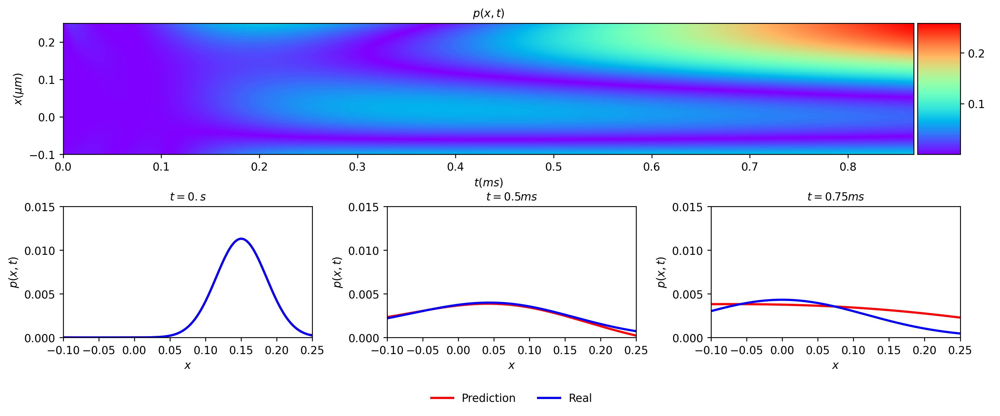

No handles with labels found to put in legend.
/var/folders/2j/yj3x01td2lqbznzlbwcpz1pc0000gn/T/ipykernel_1193/2463276901.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
No handles with labels found to put in legend.
/var/folders/2j/yj3x01td2lqbznzlbwcpz1pc0000gn/T/ipykernel_1193/2463276901.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


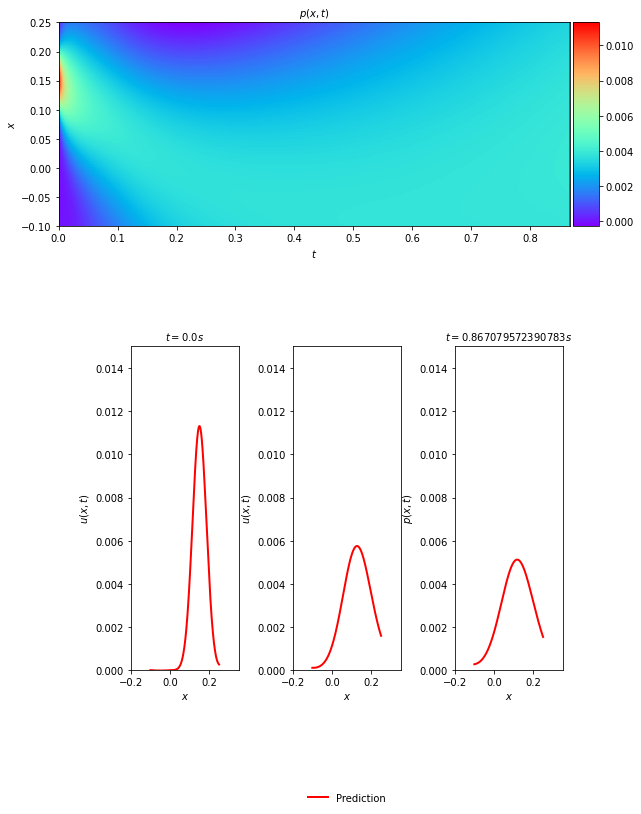

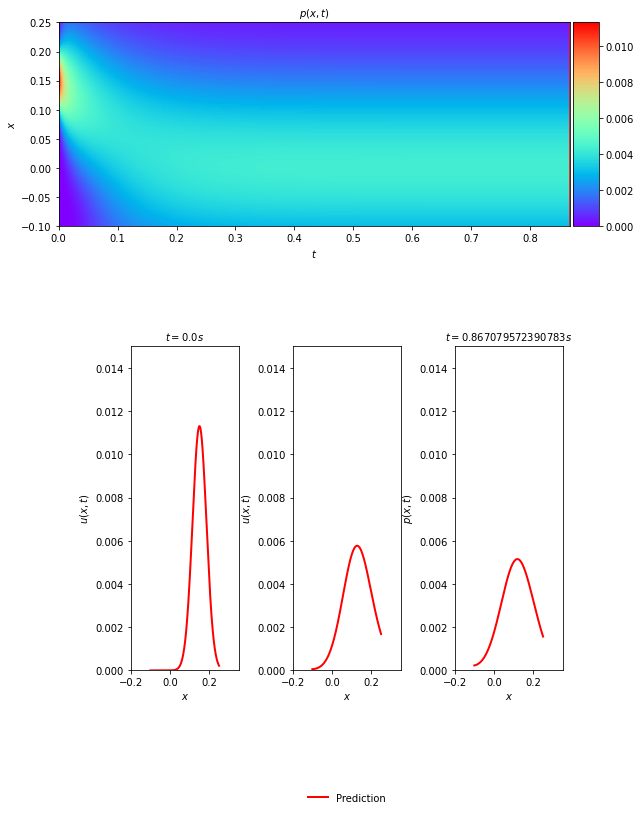

In [94]:
j = np.argmin(test_loss)
print("Best model:")
print(f"\t{best_layers[j]}")
print(f"\t{best_actfun[j]}")
print(f"{test_loss[j] = }")
pinn = PINN(best_layers[j],
            activation_function=best_actfun[j],
            a=A,
            d=D)
pinn.set_weights(np.loadtxt("models/" + best_models[j]))
p_pred = pinn.evaluate(X_p_test)
p_pred = np.reshape(p_pred,(N_x,N_steps*10),order='F')
differenceplot(p_pred, large_t_real.T)
plt.show()
solutionplot(p_pred, X_p_test)
solutionplot(large_t_real.T, X_p_test)